<a href="https://colab.research.google.com/github/SUDHANSHU4497/Book-Recommendation-System/blob/main/1_Book_Recommendation_System_sudhanshu_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

During the last few decades, with the rise of Youtube, Amazon, Netflix, and many other such
web services, recommender systems have taken more and more place in our lives. From
e-commerce (suggest to buyers articles that could interest them) to online advertisement
(suggest to users the right contents, matching their preferences), recommender systems are
today unavoidable in our daily online journeys.


In a very general way, recommender systems are algorithms aimed at suggesting relevant
items to users (items being movies to watch, text to read, products to buy, or anything else
depending on industries).


Recommender systems are really critical in some industries as they can generate a huge
amount of income when they are efficient or also be a way to stand out significantly from
competitors. The main objective is to create a book recommendation system for users.

**Content**

The Book-Crossing dataset comprises 3 files.
* Users
Contains the users. Note that user IDs (User-ID) have been anonymized and map to
integers. Demographic data is provided (Location, Age) if available. Otherwise, these
fields contain NULL values.
* Books
Books are identified by their respective ISBN. Invalid ISBNs have already been removed from the dataset. Moreover, some content-based information is given (Book-Title, Book-Author, Year-Of-Publication, Publisher), obtained from Amazon Web Services. Note that in the case of several authors, only the first is provided. URLs linking to cover images are also given, appearing in three different flavors (Image-URL-S, Image-URL-M, Image-URL-L), i.e., small, medium, large. These URLs point to the Amazon website.
* Ratings
Contains the book rating information. Ratings (Book-Rating) are either explicit,
expressed on a scale from 1-10 (higher values denoting higher appreciation), or implicit, expressed by 0.

In [1]:
# installing surprise package
pip install surprise

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 11.8 MB 5.2 MB/s 
  Created wheel for scikit-surprise: filename=scikit_surprise-1.1.1-cp37-cp37m-linux_x86_64.whl size=1633977 sha256=79e47aefd77f62441015c578af81f428ab6edf665e1e6ddd1529b1e3fe28241e
  Stored in directory: /root/.cache/pip/wheels/76/44/74/b498c42be47b2406bd27994e16c5188e337c657025ab400c1c
Successfully built scikit-surprise


**Importing important library to perform EDA**

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Ignore printing warnings for general readability
import warnings 
warnings.filterwarnings("ignore")



In [3]:
# mounting google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
#load the books,ratings,users dataset from drive
books = pd.read_csv('/content/drive/MyDrive/almabetter/BOOK RECOMMENDATION SYSTEM/Books.csv')
ratings = pd.read_csv('/content/drive/MyDrive/almabetter/BOOK RECOMMENDATION SYSTEM/Ratings.csv')
users = pd.read_csv('/content/drive/MyDrive/almabetter/BOOK RECOMMENDATION SYSTEM/Users.csv')

In [5]:
# create duplicates to prevent from data loss( if any)
books_df=books.copy()
ratings_df=ratings.copy()
users_df=users.copy()

##**Data cleaning and EDA**

 **books dataset**

In [6]:
# setting up to display all the feature
pd.set_option("display.max_columns", None)

# previewing top 5 rows of books datasets
books_df.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [7]:
# previewing top 5 rows of rating datasets
ratings_df.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [8]:
# previewing top 5 rows of users datasets
users_df.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [9]:
books_df.shape

(271360, 8)

**shape of datasets**

In [10]:
# printing number of rows and columns using format string
print(f'books dataset have {books_df.shape[0]} rows and {books_df.shape[1]} columns')
print(f'ratings dataset have {ratings_df.shape[0]} rows and {ratings_df.shape[1]} columns')
print(f'users dataset have {users_df.shape[0]} rows and {users_df.shape[1]} columns')

books dataset have 271360 rows and 8 columns
ratings dataset have 1149780 rows and 3 columns
users dataset have 278858 rows and 3 columns


In [11]:
# overview book dataset
books_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271360 non-null  object
 1   Book-Title           271360 non-null  object
 2   Book-Author          271359 non-null  object
 3   Year-Of-Publication  271360 non-null  object
 4   Publisher            271358 non-null  object
 5   Image-URL-S          271360 non-null  object
 6   Image-URL-M          271360 non-null  object
 7   Image-URL-L          271357 non-null  object
dtypes: object(8)
memory usage: 16.6+ MB


**Insights:**

For books datasets:
* total number of entries are 271360.
* for **Book-Author** columns total number of entries are 271359, it means that one null data.
* for **Publisher** columns total number of entries are 271358, it means that two null data
* 

In [12]:
#renaming some of the column names for books_df
dict = {'Book-Title': 'title',
        'Book-Author': 'author',
        'Year-Of-Publication': 'publication_year',
        }

books_df.rename(columns=dict,inplace=True)


In [13]:
books_df.head()

,ISBN,title,author,publication_year,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


**checking for duplicates data**

In [14]:
# checking for duplicates in book dataset
books_df_duplicate_rows=books_df[books_df.duplicated()]
print("no of duplicate rows :", books_df_duplicate_rows.shape[0])

no of duplicate rows : 0


**Insights:**

wow!! there is **no** **duplicate** records in **books dataset**

**checking for null data**

In [15]:
# checking for null value in book dataset
books_df.isnull().sum().sort_values(ascending=False)


Image-URL-L         3
Publisher           2
author              1
ISBN                0
title               0
publication_year    0
Image-URL-S         0
Image-URL-M         0
dtype: int64

As expected from data overview, 
* two null value in Publisher columns.
* one null values in authors columns.

In [16]:
# checking null value in Book-Author column of book dataset
books_df.loc[books_df['author'].isnull()]

,ISBN,title,author,publication_year,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
187689,9627982032,The Credit Suisse Guide to Managing Your Perso...,NaN,1995,Edinburgh Financial Publishing,http://images.amazon.com/images/P/9627982032.0...,http://images.amazon.com/images/P/9627982032.0...,http://images.amazon.com/images/P/9627982032.0...


In [17]:
# lets replace nan value of book author with others 
books_df.at[187689 ,'author'] = 'Other'

In [18]:
# similarly, checking null values in Publisher columns
books_df.loc[books_df['Publisher'].isnull()]

,ISBN,title,author,publication_year,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
128890,193169656X,Tyrant Moon,Elaine Corvidae,2002,NaN,http://images.amazon.com/images/P/193169656X.0...,http://images.amazon.com/images/P/193169656X.0...,http://images.amazon.com/images/P/193169656X.0...
129037,1931696993,Finders Keepers,Linnea Sinclair,2001,NaN,http://images.amazon.com/images/P/1931696993.0...,http://images.amazon.com/images/P/1931696993.0...,http://images.amazon.com/images/P/1931696993.0...


In [19]:
# Lets replace null values of Publisher column with others
books_df.at[128890,'Publisher']='Others'
books_df.at[129037,'Publisher']='Others'

**Checking for unique values**

In [20]:
# function to check unique value in dataframe
def unique(df):
  for col in df:
    print(f'{col}:\n {df[col].unique()}\n')

In [21]:
# checking unique value in book dataset
unique(books_df)

ISBN:
 ['0195153448' '0002005018' '0060973129' ... '006008667X' '0192126040'
 '0767409752']

title:
 ['Classical Mythology' 'Clara Callan' 'Decision in Normandy' ...
 'Lily Dale : The True Story of the Town that Talks to the Dead'
 "Republic (World's Classics)"
 "A Guided Tour of Rene Descartes' Meditations on First Philosophy with Complete Translations of the Meditations by Ronald Rubin"]

author:
 ['Mark P. O. Morford' 'Richard Bruce Wright' "Carlo D'Este" ...
 'David Biggs' 'Teri Sloat' 'Christopher  Biffle']

publication_year:
 [2002 2001 1991 1999 2000 1993 1996 1988 2004 1998 1994 2003 1997 1983
 1979 1995 1982 1985 1992 1986 1978 1980 1952 1987 1990 1981 1989 1984 0
 1968 1961 1958 1974 1976 1971 1977 1975 1965 1941 1970 1962 1973 1972
 1960 1966 1920 1956 1959 1953 1951 1942 1963 1964 1969 1954 1950 1967
 2005 1957 1940 1937 1955 1946 1936 1930 2011 1925 1948 1943 1947 1945
 1923 2020 1939 1926 1938 2030 1911 1904 1949 1932 1928 1929 1927 1931
 1914 2050 1934 1910 1933 1902 192

**Insights:**

for books dataset:

few data is not feasible in **publication_year** feature like 'DK Publishing Inc','Gallimard','2024','2037','2030',2038, 2026, 0 which could not be there in dataset so,we have to manipulate it before developing a recommender system.

In [22]:
# lets check in how many rows are the year as DK Publishing inc
books_df[books_df['publication_year']=='DK Publishing Inc']

,ISBN,title,author,publication_year,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
209538,078946697X,"DK Readers: Creating the X-Men, How It All Beg...",2000,DK Publishing Inc,http://images.amazon.com/images/P/078946697X.0...,http://images.amazon.com/images/P/078946697X.0...,http://images.amazon.com/images/P/078946697X.0...,NaN
221678,0789466953,"DK Readers: Creating the X-Men, How Comic Book...",2000,DK Publishing Inc,http://images.amazon.com/images/P/0789466953.0...,http://images.amazon.com/images/P/0789466953.0...,http://images.amazon.com/images/P/0789466953.0...,NaN


In [23]:
# lets check in how many rows are the year as 'Gallimard'
books_df[books_df['publication_year']=='Gallimard']

,ISBN,title,author,publication_year,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
220731,2070426769,"Peuple du ciel, suivi de 'Les Bergers\"";Jean-M...",2003,Gallimard,http://images.amazon.com/images/P/2070426769.0...,http://images.amazon.com/images/P/2070426769.0...,http://images.amazon.com/images/P/2070426769.0...,NaN


In [24]:
# (books_df[books_df['Year-Of-Publication']=='DK Publishing Inc']).shift(1, axis=1)

In [25]:
books_df.at[209538 ,'Publisher'] = 'DK Publishing Inc'
books_df.at[209538 ,'publication_year'] = 2000
books_df.at[209538 ,'Book-Title'] = 'DK Readers: Creating the X-Men, How It All Began (Level 4: Proficient Readers)'
books_df.at[209538 ,'Book-Author'] = 'Michael Teitelbaum'

books_df.at[221678 ,'Publisher'] = 'DK Publishing Inc'
books_df.at[221678 ,'publication_year'] = 2000
books_df.at[221678 ,'Book-Title'] = 'DK Readers: Creating the X-Men, How Comic Books Come to Life (Level 4: Proficient Readers)'
books_df.at[221678 ,'Book-Author'] = 'James Buckley'

books_df.at[220731 ,'Publisher'] = 'Gallimard'
books_df.at[220731 ,'publication_year'] = '2003'
books_df.at[220731 ,'Book-Title'] = 'Peuple du ciel - Suivi de Les bergers '
books_df.at[220731 ,'Book-Author'] = 'Jean-Marie Gustave Le ClÃ?Â©zio'

In [26]:
# recheck the book information through index
books_df.loc[220731]

ISBN                                                       2070426769
title               Peuple du ciel, suivi de 'Les Bergers\";Jean-M...
author                                                           2003
publication_year                                                 2003
Publisher                                                   Gallimard
Image-URL-S         http://images.amazon.com/images/P/2070426769.0...
Image-URL-M         http://images.amazon.com/images/P/2070426769.0...
Image-URL-L                                                       NaN
Book-Title                     Peuple du ciel - Suivi de Les bergers 
Book-Author                           Jean-Marie Gustave Le ClÃ?Â©zio
Name: 220731, dtype: object

In [27]:
books_df.loc[221678]

ISBN                                                       0789466953
title               DK Readers: Creating the X-Men, How Comic Book...
author                                                           2000
publication_year                                                 2000
Publisher                                           DK Publishing Inc
Image-URL-S         http://images.amazon.com/images/P/0789466953.0...
Image-URL-M         http://images.amazon.com/images/P/0789466953.0...
Image-URL-L                                                       NaN
Book-Title          DK Readers: Creating the X-Men, How Comic Book...
Book-Author                                             James Buckley
Name: 221678, dtype: object

In [28]:
books_df.loc[209538]

ISBN                                                       078946697X
title               DK Readers: Creating the X-Men, How It All Beg...
author                                                           2000
publication_year                                                 2000
Publisher                                           DK Publishing Inc
Image-URL-S         http://images.amazon.com/images/P/078946697X.0...
Image-URL-M         http://images.amazon.com/images/P/078946697X.0...
Image-URL-L                                                       NaN
Book-Title          DK Readers: Creating the X-Men, How It All Beg...
Book-Author                                        Michael Teitelbaum
Name: 209538, dtype: object

In [29]:
## Converting year of publication in Numbers
books_df['publication_year'] = books_df['publication_year'].astype(int)

In [30]:
print(sorted(list(books_df['publication_year'].unique())))

[0, 1376, 1378, 1806, 1897, 1900, 1901, 1902, 1904, 1906, 1908, 1909, 1910, 1911, 1914, 1917, 1919, 1920, 1921, 1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2008, 2010, 2011, 2012, 2020, 2021, 2024, 2026, 2030, 2037, 2038, 2050]


**Insights:**

It is observe that:
* minimum year is 0 and maximum year is 2050.
* publication year after 2021 is not possible.
* publication year cannot be 0.

In [31]:
# checking for how many rows have publication year after 2021
book_df_more = books_df[(books_df['publication_year'] > 2021)] 
book_df_more.head()

,ISBN,title,author,publication_year,Publisher,Image-URL-S,Image-URL-M,Image-URL-L,Book-Title,Book-Author
37487,0671746103,MY TEACHER FRIED MY BRAINS (RACK SIZE) (MY TEA...,Coville,2030,Aladdin,http://images.amazon.com/images/P/0671746103.0...,http://images.amazon.com/images/P/0671746103.0...,http://images.amazon.com/images/P/0671746103.0...,NaN,NaN
55676,0671791990,MY TEACHER FLUNKED THE PLANET (RACK SIZE) (MY ...,Bruce Coville,2030,Aladdin,http://images.amazon.com/images/P/0671791990.0...,http://images.amazon.com/images/P/0671791990.0...,http://images.amazon.com/images/P/0671791990.0...,NaN,NaN
78168,0870449842,Crossing America,National Geographic Society,2030,National Geographic,http://images.amazon.com/images/P/0870449842.0...,http://images.amazon.com/images/P/0870449842.0...,http://images.amazon.com/images/P/0870449842.0...,NaN,NaN
80264,0140301690,Alice's Adventures in Wonderland and Through t...,Lewis Carroll,2050,Puffin Books,http://images.amazon.com/images/P/0140301690.0...,http://images.amazon.com/images/P/0140301690.0...,http://images.amazon.com/images/P/0140301690.0...,NaN,NaN
97826,0140201092,Outline of European Architecture (Pelican S.),Nikolaus Pevsner,2050,Penguin USA,http://images.amazon.com/images/P/0140201092.0...,http://images.amazon.com/images/P/0140201092.0...,http://images.amazon.com/images/P/0140201092.0...,NaN,NaN


In [32]:
book_df_more.shape

(13, 10)

**Insights:**

There are **13 rows** in a dataset having **publication year** **after 2021.**

In [33]:
# checking for how many rows have publication year is 0
book_df_zero = books_df[books_df['publication_year'] ==0]
book_df_zero

,ISBN,title,author,publication_year,Publisher,Image-URL-S,Image-URL-M,Image-URL-L,Book-Title,Book-Author
176,3150000335,Kabale Und Liebe,Schiller,0,"Philipp Reclam, Jun Verlag GmbH",http://images.amazon.com/images/P/3150000335.0...,http://images.amazon.com/images/P/3150000335.0...,http://images.amazon.com/images/P/3150000335.0...,NaN,NaN
188,342311360X,Die Liebe in Den Zelten,Gabriel Garcia Marquez,0,Deutscher Taschenbuch Verlag (DTV),http://images.amazon.com/images/P/342311360X.0...,http://images.amazon.com/images/P/342311360X.0...,http://images.amazon.com/images/P/342311360X.0...,NaN,NaN
288,0571197639,Poisonwood Bible Edition Uk,Barbara Kingsolver,0,Faber Faber Inc,http://images.amazon.com/images/P/0571197639.0...,http://images.amazon.com/images/P/0571197639.0...,http://images.amazon.com/images/P/0571197639.0...,NaN,NaN
351,3596214629,"Herr Der Fliegen (Fiction, Poetry and Drama)",Golding,0,Fischer Taschenbuch Verlag GmbH,http://images.amazon.com/images/P/3596214629.0...,http://images.amazon.com/images/P/3596214629.0...,http://images.amazon.com/images/P/3596214629.0...,NaN,NaN
542,8845229041,Biblioteca Universale Rizzoli: Sulla Sponda De...,P Coelho,0,Fabbri - RCS Libri,http://images.amazon.com/images/P/8845229041.0...,http://images.amazon.com/images/P/8845229041.0...,http://images.amazon.com/images/P/8845229041.0...,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
270794,014029953X,Foe (Essential.penguin S.),J.M. Coetzee,0,Penguin Books Ltd,http://images.amazon.com/images/P/014029953X.0...,http://images.amazon.com/images/P/014029953X.0...,http://images.amazon.com/images/P/014029953X.0...,NaN,NaN
270913,0340571187,Postmens House,Maggie Hemingway,0,Trafalgar Square,http://images.amazon.com/images/P/0340571187.0...,http://images.amazon.com/images/P/0340571187.0...,http://images.amazon.com/images/P/0340571187.0...,NaN,NaN
271094,8427201079,El Misterio De Sittaford,Agatha Christie,0,Editorial Molino,http://images.amazon.com/images/P/8427201079.0...,http://images.amazon.com/images/P/8427201079.0...,http://images.amazon.com/images/P/8427201079.0...,NaN,NaN
271182,0887781721,Tom Penny,Tony German,0,P. Martin Associates,http://images.amazon.com/images/P/0887781721.0...,http://images.amazon.com/images/P/0887781721.0...,http://images.amazon.com/images/P/0887781721.0...,NaN,NaN


In [34]:
book_df_zero.shape

(4618, 10)

**Insights:**

There are **4618 rows** in a dataset having **publication year** is **0**

In [35]:
# finding out most popular publication year
books_year= books_df['publication_year'].value_counts().sort_values(ascending=False)


print(books_year.head(1))
print('\n')
print(books_year.tail(1))

2002    17627
Name: publication_year, dtype: int64


2037    1
Name: publication_year, dtype: int64


In [36]:
books_year.head(30)

2002    17627
1999    17431
2001    17359
2000    17234
1998    15766
1997    14890
2003    14359
1996    14030
1995    13546
1994    11796
1993    10602
1992     9906
1991     9389
1990     8660
1989     7936
1988     7492
1987     6529
1986     5841
2004     5839
1985     5343
1984     4986
0        4618
1983     4499
1982     4197
1981     3279
1980     2676
1979     2208
1978     2131
1977     1897
1976     1597
Name: publication_year, dtype: int64

**Insights:**

from above pandas series 
* it is observe that most of the books having publication year is 2002.
* only 1 books is published in 1376.

In [37]:
## Replacing Invalid years with max year
from collections import Counter
count = Counter(books_df['publication_year'])
[k for k, v in count.items() if v == max(count.values())]

[2002]

In [38]:
# we will replace publication year after 2021 and 0  with 2002
books_df.loc[books_df['publication_year'] > 2021, 'publication_year'] = 2002
books_df.loc[books_df['publication_year'] == 0, 'publication_year'] = 2002

The maximum year in this dataset is: 2021.0
The minimum year in this dataset is: 1376.0


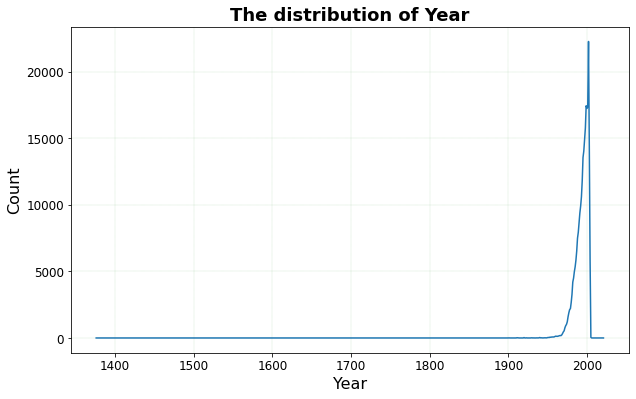

In [39]:
# count the number of year
years_count = books_df['publication_year'].value_counts().to_frame().reset_index()
years_count.columns =['publication_year', 'count']
years_count = years_count.sort_values(by='publication_year', ascending=True)
years_count['percentage(%)'] = round(years_count['count']/sum(years_count['count']), 4)*100
print('The maximum year in this dataset is:', years_count.iloc[-1]['publication_year'])
print('The minimum year in this dataset is:', years_count.iloc[0]['publication_year'])

# plot the distribution of year and we only show top 15
years_count['publication_year'] = pd.to_numeric(years_count['publication_year'])
plt.figure(figsize = (10, 6))

# plotting line plot for year
ax = sns.lineplot(data=years_count, x='publication_year', y='count')

# setting up title
plt.title("The distribution of Year", fontsize = 18, fontweight='bold')

# setting up x and y label
plt.xlabel("Year", fontsize = 16)
plt.ylabel("Count", fontsize = 16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)


# enable grid
plt.grid(color = 'green', linestyle = '--', linewidth = 0.1)

**Insights:**

* From above plot it is observe that,most of the books are published between 1950 to 2002

* 2002 is the peak year.


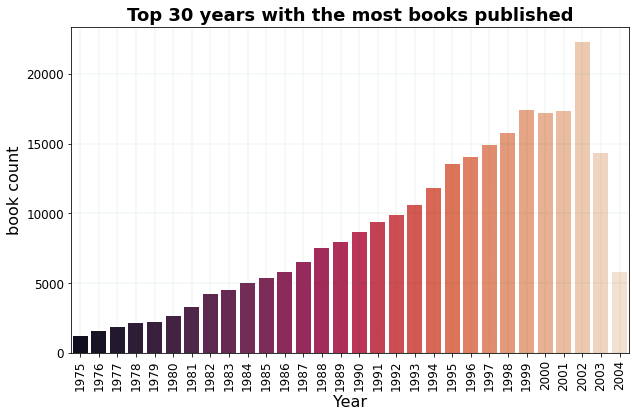

In [40]:
# setting figuresize
plt.subplots(figsize=(10,6))

# plotting bar plot
sns.barplot(x = books_df['publication_year'].value_counts()[:30].index,y = books_df['publication_year'].value_counts()[:30].values,
            palette = 'rocket')

plt.title('Top 30 years with the most books published',fontsize=18, fontweight='bold')

# setting  label
plt.xlabel("Year", fontsize = 16)
plt.ylabel("book count", fontsize = 16)
plt.xticks(fontsize=12,rotation = 90)
plt.yticks(fontsize=12)

# enable grid
plt.grid(color = 'green', linestyle = '--', linewidth = 0.1)
plt.show()

**Insights:**

In this diagram, it is found that book count increases gradually from 1975 to 2002, and reaches to its maximum value in 2002 and then decreases.

In [41]:
books_df.columns

Index(['ISBN', 'title', 'author', 'publication_year', 'Publisher',
       'Image-URL-S', 'Image-URL-M', 'Image-URL-L', 'Book-Title',
       'Book-Author'],
      dtype='object')

In [42]:
# finding out most popular publication year
books_author= books_df['author'].value_counts().sort_values(ascending=False)

print(books_author.head(1))
print('\n')
print(books_author.tail(1))

Agatha Christie    632
Name: author, dtype: int64


Christopher  Biffle    1
Name: author, dtype: int64


In [43]:
books_author.head(30)

Agatha Christie          632
William Shakespeare      567
Stephen King             524
Ann M. Martin            423
Carolyn Keene            373
Francine Pascal          372
Isaac Asimov             330
Nora Roberts             315
Barbara Cartland         307
Charles Dickens          302
Not Applicable (Na )     286
R. L. Stine              282
Mark Twain               231
Jane Austen              223
Terry Pratchett          220
Mary Higgins Clark       218
Piers Anthony            217
Marion Zimmer Bradley    216
Janet Dailey             214
Franklin W. Dixon        204
Roald Dahl               195
J. R. R. Tolkien         174
Tom Clancy               174
Dick Francis             174
Danielle Steel           173
Anne McCaffrey           172
John Steinbeck           172
Fern Michaels            165
Nathaniel Hawthorne      165
Diana Palmer             164
Name: author, dtype: int64

**Insights:**

* most popular author is Agatha Christie and Christopher  Biffle least popular.
* William Shakespeare ranked second position from top.

In [44]:
# finding out most popular publication year
books_publisher= books_df['Publisher'].value_counts().sort_values(ascending=False)
print(books_publisher.head(1))
print('\n')
print(books_publisher.tail(1))

Harlequin    7535
Name: Publisher, dtype: int64


Connaught    1
Name: Publisher, dtype: int64


In [45]:
books_publisher.head(30)

Harlequin                             7535
Silhouette                            4220
Pocket                                3905
Ballantine Books                      3783
Bantam Books                          3646
Scholastic                            3160
Simon &amp; Schuster                  2971
Penguin Books                         2844
Berkley Publishing Group              2771
Warner Books                          2727
Penguin USA                           2717
Harpercollins                         2525
Fawcett Books                         2258
Signet Book                           2070
Random House Inc                      2045
St Martins Pr                         1953
St. Martin's Press                    1783
Tor Books                             1704
HarperCollins Publishers              1700
Zebra Books                           1694
Bantam                                1660
Avon                                  1566
Jove Books                            1553
Vintage Boo

**Insights:**

* Harlequin is the most popular publisher followed by Silhouette and pocket.
* Connaught is least popular publisher

In [46]:
def without_hue(ax, feature):
    total = len(feature)
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05 
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)

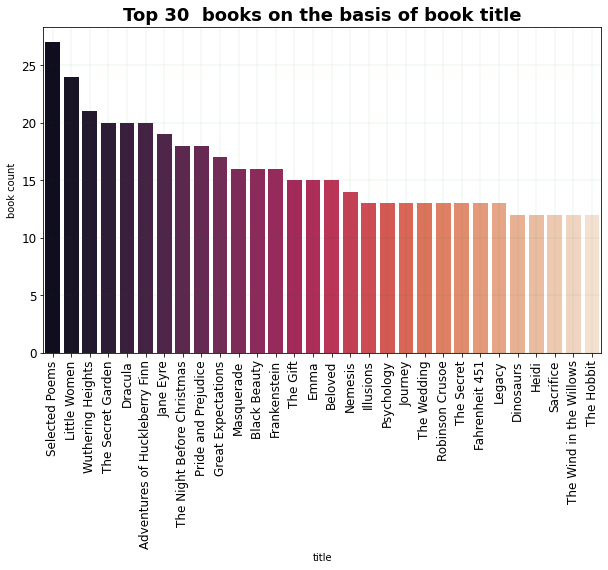

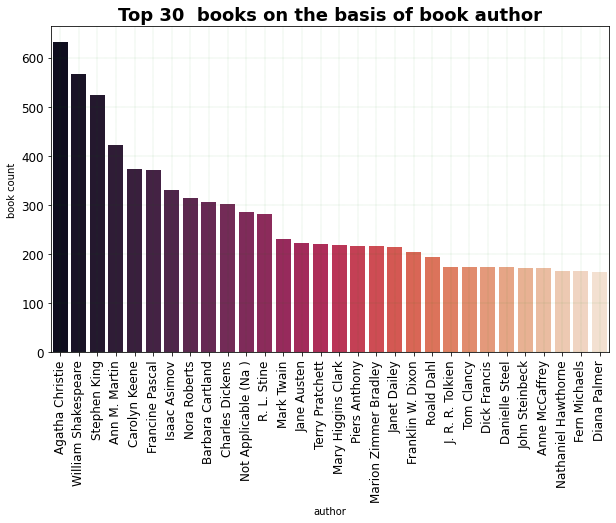

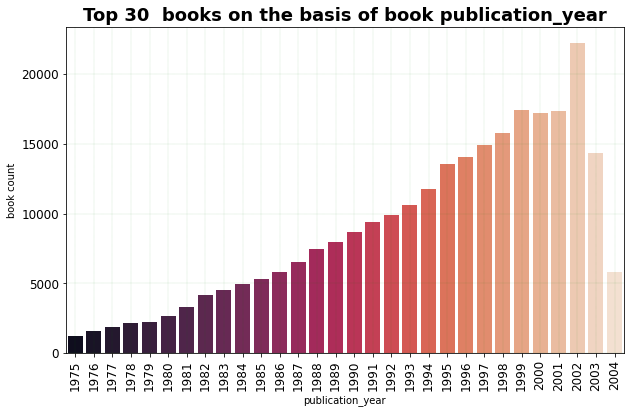

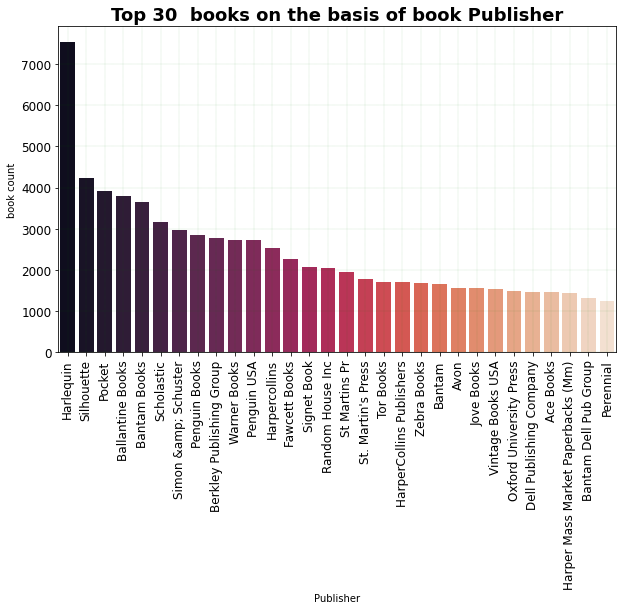

In [47]:
cols= ['title', 'author', 'publication_year', 'Publisher']
for col in cols:
  # setting figure size
  plt.subplots(figsize=(10,6))
  
  #plotting barplot
  sns.barplot(x = books_df[col].value_counts()[:30].index,y = books_df[col].value_counts()[:30].values,
              palette = 'rocket').set(xlabel = col , ylabel = 'book count')
  # setting up title
  plt.title(f'Top 30  books on the basis of book {col}', fontsize=18, fontweight='bold')

  # setting up x label
  plt.xticks(fontsize=12, rotation = 90)
  plt.yticks(fontsize=12)

# setting grid
  plt.grid(color = 'green', linestyle = '--', linewidth = 0.1)

plt.show()

In [48]:
# removing unnecessary columns
books_df=books_df.drop(['Book-Title','Book-Author','Image-URL-S','Image-URL-M','Image-URL-L' ], axis=1)

In [49]:
books_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 5 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   ISBN              271360 non-null  object
 1   title             271360 non-null  object
 2   author            271360 non-null  object
 3   publication_year  271360 non-null  int64 
 4   Publisher         271360 non-null  object
dtypes: int64(1), object(4)
memory usage: 10.4+ MB


**Insights:**

* books datsets is fully clean

 **Ratings Dataset**

In [50]:
# previewing number of rows and columns
ratings_df.shape

(1149780, 3)

In [51]:
# previewing name of columns
ratings_df.columns

Index(['User-ID', 'ISBN', 'Book-Rating'], dtype='object')

In [52]:
# previewing top 5 rows
ratings_df.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [53]:
# overviewing rating datasets
ratings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149780 entries, 0 to 1149779
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   User-ID      1149780 non-null  int64 
 1   ISBN         1149780 non-null  object
 2   Book-Rating  1149780 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 26.3+ MB


**Insights:**

* Total entries is 1149780.
* there is no null data.

In [54]:
# rename columns name
ratings_df.rename(columns={'Book-Rating':'rating'},inplace=True)

**checking for duplicates data**

In [55]:
ratings_df_duplicate_rows=ratings_df[ratings_df.duplicated()]
print("no of duplicate rows :", ratings_df_duplicate_rows.shape[0])

no of duplicate rows : 0


**Insights:**

there is no duplicates data

**checking for null data**

In [56]:

ratings_df.isnull().sum().sort_values(ascending=False)


User-ID    0
ISBN       0
rating     0
dtype: int64

**Insights:**

there is no null data

In [177]:
# previewing each unique value in each columns
unique(ratings_df)

User-ID:
 [276725 276726 276727 ... 276709 276721 276723]

ISBN:
 ['034545104X' '0155061224' '0446520802' ... '0679752714' '0806917695'
 '05162443314']

rating:
 [ 0  5  3  6  8  7 10  9  4  1  2]



In [58]:
# previewing rating count for each rating
book_ratings=pd.value_counts(ratings_df['rating']).iloc[:20]
book_ratings


0     716109
8     103736
10     78610
7      76457
9      67541
5      50974
6      36924
4       8904
3       5996
2       2759
1       1770
Name: rating, dtype: int64

**Insights:**

* most of the user rated 0 followed by 8 and 10.
* very less number of user rated 1.


In [59]:
# plt.figure(figsize=(10,6))
# plt.pie(book_ratings, autopct='%.f%%')
# plt.show()

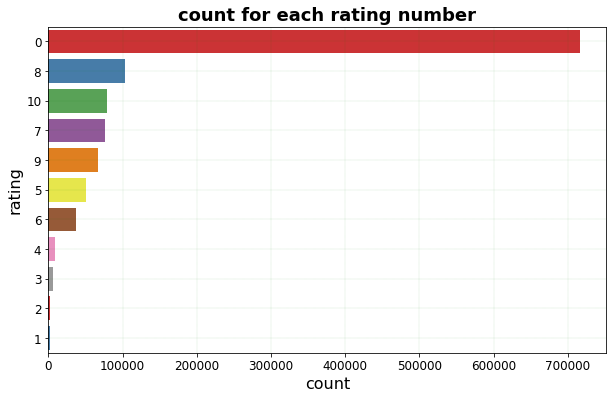

In [60]:
# setting figure size
plt.figure(figsize=(10,6))

# plotting count plot
sns.countplot(y='rating', data=ratings_df, order=pd.value_counts(ratings_df['rating']).iloc[:20].index,  palette='Set1')

# setting up title
plt.title('count for each rating number', fontsize=18, fontweight='bold')

# setting up x and y label
plt.xlabel("count", fontsize = 16)
plt.ylabel("rating", fontsize = 16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# setting grid
plt.grid(color = 'green', linestyle = '--', linewidth = 0.1)

**Insights:**

book count for 0 rating is large as compare to others ratings, hence we will again barplot for ratings excluding 0 rating.

according to data description : "Ratings Contains the book rating information. Ratings (Book-Rating) are either explicit, expressed on a scale from 1-10 (higher values denoting higher appreciation), or implicit, expressed by 0 "

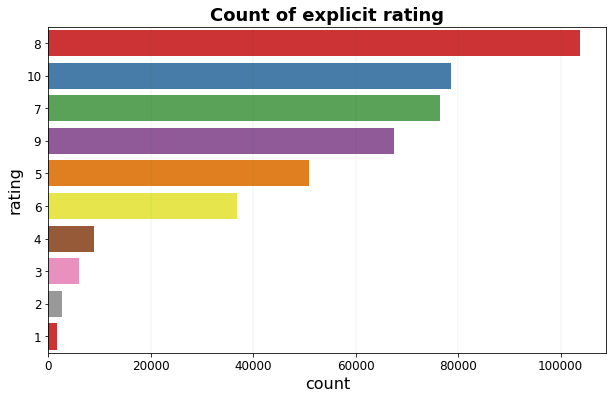

In [61]:
# setting figure size
plt.figure(figsize=(10,6))

# plotting countplot
sns.countplot(y='rating', data=ratings_df, order=book_ratings[1:].index,  palette='Set1')

# setting up title
plt.title('Count of explicit rating', fontsize = 18, fontweight='bold')

# setting up x and y label
plt.xlabel("count", fontsize = 16)
plt.ylabel("rating", fontsize = 16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# setting grid
plt.grid(axis = 'x',color = 'green', linestyle = '--', linewidth = 0.1)

**Insights:**

we removed the 0 rating and plotting count plot.
* most of the user rated 8 followed by 10 and 7.
* very less number of user rated 1.

**users datasets**

In [62]:
# previewing top 5 rows
users_df.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [63]:
#overviewing dataframe
users_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   User-ID   278858 non-null  int64  
 1   Location  278858 non-null  object 
 2   Age       168096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 6.4+ MB


**Insights:**

For users datasets:

* Total number of entries are 278858.
* For **age** columns total number of entries are 168096, it means that one null data.


In [64]:
# shape of dataframe
users_df.shape

(278858, 3)

In [65]:
# previewing columns name
users_df.columns

Index(['User-ID', 'Location', 'Age'], dtype='object')

**checking for duplicates data**

In [66]:
#check for duplicates rows
users_df_duplicate_rows=users_df[users_df.duplicated()]
print("no of duplicate rows :", users_df_duplicate_rows.shape[0])

no of duplicate rows : 0


**checking for null data**

In [67]:
#check for null value
users_df.isnull().sum().sort_values(ascending=False)


Age         110762
User-ID          0
Location         0
dtype: int64

**Insights:**

There are 110762 null data in age columns

In [68]:
# finding unique value in each columns
unique(users_df)

User-ID:
 [     1      2      3 ... 278856 278857 278858]

Location:
 ['nyc, new york, usa' 'stockton, california, usa'
 'moscow, yukon territory, russia' ... 'sergnano, lombardia, italy'
 'stranraer, n/a, united kingdom' 'tacoma, washington, united kingdom']

Age:
 [ nan  18.  17.  61.  26.  14.  25.  19.  46.  55.  32.  24.  20.  34.
  23.  51.  31.  21.  44.  30.  57.  43.  37.  41.  54.  42.  50.  39.
  53.  47.  36.  28.  35.  13.  58.  49.  38.  45.  62.  63.  27.  33.
  29.  66.  40.  15.  60.   0.  79.  22.  16.  65.  59.  48.  72.  56.
  67.   1.  80.  52.  69.  71.  73.  78.   9.  64. 103. 104.  12.  74.
  75. 231.   3.  76.  83.  68. 119.  11.  77.   2.  70.  93.   8.   7.
   4.  81. 114. 230. 239.  10.   5. 148. 151.   6. 101. 201.  96.  84.
  82.  90. 123. 244. 133.  91. 128.  94.  85. 141. 110.  97. 219.  86.
 124.  92. 175. 172. 209. 212. 237.  87. 162. 100. 156. 136.  95.  89.
 106.  99. 108. 210.  88. 199. 147. 168. 132. 159. 186. 152. 102. 116.
 200. 115. 226. 137. 20

In [69]:
# extracting top 20 country from users dataframe
country_count=pd.value_counts(users_df['Location']).iloc[:20]
country_count

london, england, united kingdom        2506
toronto, ontario, canada               2250
sydney, new south wales, australia     1744
melbourne, victoria, australia         1708
portland, oregon, usa                  1629
chicago, illinois, usa                 1526
seattle, washington, usa               1484
new york, new york, usa                1411
madrid, madrid, spain                  1400
vancouver, british columbia, canada    1359
san diego, california, usa             1277
san francisco, california, usa         1269
ottawa, ontario, canada                1243
houston, texas, usa                    1187
berlin, berlin, germany                1173
milano, lombardia, italy               1157
los angeles, california, usa           1005
austin, texas, usa                      986
calgary, alberta, canada                981
barcelona, barcelona, spain             905
Name: Location, dtype: int64

**Insights:**

When we perform value count on location, it is found that most of the users from London london, england, united kingdom .

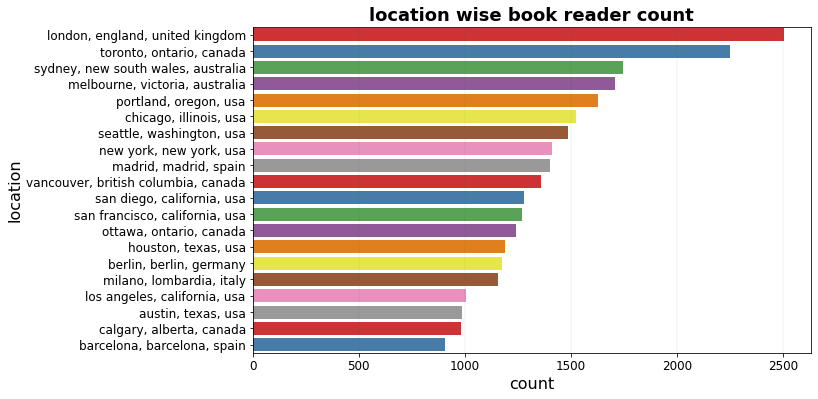

In [70]:
# setting figure size
plt.figure(figsize=(10,6))

# plotting countplot
sns.countplot(y='Location', data=users_df, order=pd.value_counts(users_df['Location']).iloc[:20].index,  palette='Set1')

# setting up title
plt.title('location wise book reader count',fontsize=18, fontweight='bold')

# setting up x and y label
plt.xlabel("count", fontsize = 16)
plt.ylabel("location", fontsize = 16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# setting grid
plt.grid(axis = 'x',color = 'green', linestyle = '--', linewidth = 0.1)

plt.show()

**Insights:**

when we consider top 20 book reader by location, it is found that:
* london, england, united kingdom is the most popular place for book reader followed by canada.
* out of top 20 location, 9 location from usa followed by canada.

In [71]:
# extracting country from location columns
users_df['country']=users_df['Location'].str.split(',').str.get(-1)

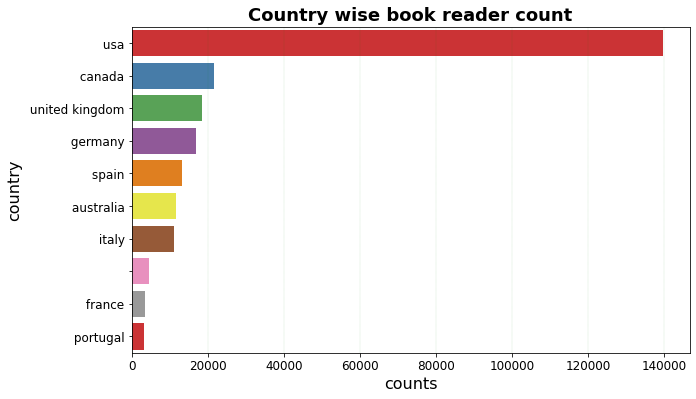

In [72]:
# setting figure size
plt.figure(figsize=(10,6))

# plotting countplot
sns.countplot(y='country', data=users_df, order=pd.value_counts(users_df['country']).iloc[:10].index,  palette='Set1')

# setting up title
plt.title('Country wise book reader count', fontsize=18, fontweight='bold')

# setting grid
plt.grid(axis = 'x',color = 'green', linestyle = '--', linewidth = 0.1)

# setting up x and y label
plt.xlabel("counts", fontsize = 16)
plt.ylabel("country", fontsize = 16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.show()

**Insights:**

When we extracted country name from location columns, it is found that most of the book reader from usa followed by canada and united kingdom.

In [73]:
#merging dataframe
ratings_with_name = ratings_df.merge(books_df,on='ISBN')

In [74]:
ratings_with_name.head()

,User-ID,ISBN,rating,title,author,publication_year,Publisher
0,276725,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books
1,2313,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books
2,6543,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books
3,8680,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books
4,10314,034545104X,9,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books


(array([0.   , 0.005, 0.01 , 0.015, 0.02 , 0.025, 0.03 , 0.035]),
 <a list of 8 Text major ticklabel objects>)

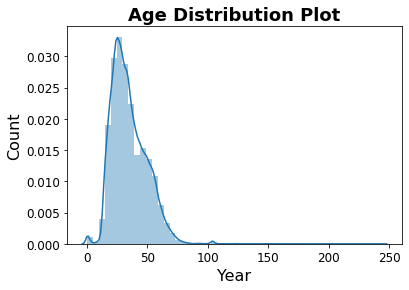

In [75]:
# checking age distribution
sns.distplot(users_df.Age)

# setting up title
plt.title('Age Distribution Plot', fontsize=18, fontweight='bold')


# setting up x and y label
plt.xlabel("Year", fontsize = 16)
plt.ylabel("Count", fontsize = 16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)


**Insights:**

outlier!!!  
age more than 100 is not possible

In [76]:
# outlier data became NaN
users_df.loc[(users_df.Age > 100) | (users_df.Age < 3), 'Age'] = np.nan

In [77]:
# users_df['Age'] = users_df['Age'].fillna(users_df.groupby('country')['Age'].transform('median'))

In [78]:
users_df['Age'].fillna(users_df.Age.mean(),inplace=True)

In [79]:
#checking null value
users_df.isna().sum()

User-ID     0
Location    0
Age         0
country     0
dtype: int64

**Merging all dataset**

In [80]:
#merging all the three dataset
total_df = ratings_df.merge(books_df,how='inner',on='ISBN')
total_df = total_df.merge(users_df,how='inner',on='User-ID')

In [81]:
total_df

,User-ID,ISBN,rating,title,author,publication_year,Publisher,Location,Age,country
0,276725,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,"tyler, texas, usa",34.732922,usa
1,2313,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,"cincinnati, ohio, usa",23.000000,usa
2,2313,0812533550,9,Ender's Game (Ender Wiggins Saga (Paperback)),Orson Scott Card,1986,Tor Books,"cincinnati, ohio, usa",23.000000,usa
3,2313,0679745580,8,In Cold Blood (Vintage International),TRUMAN CAPOTE,1994,Vintage,"cincinnati, ohio, usa",23.000000,usa
4,2313,0060173289,9,Divine Secrets of the Ya-Ya Sisterhood : A Novel,Rebecca Wells,1996,HarperCollins,"cincinnati, ohio, usa",23.000000,usa
...,...,...,...,...,...,...,...,...,...,...
1031131,276442,2862749796,7,Le Huit,Katherine Neville,2002,Le Cherche Midi,"genève, genève, switzerland",62.000000,switzerland
1031132,276618,3788097000,5,Ludwig Marum: Briefe aus dem Konzentrationslag...,Ludwig Marum,1984,C.F. MÃ¼ller,"stuttgart, \n/a\""., germany""",34.732922,"germany"""
1031133,276647,0553571001,0,Christmas With Anne and Other Holiday Stories:...,L. M. Montgomery,2001,Starfire,"arlington heights, illinois, usa",13.000000,usa
1031134,276647,0689822294,10,Heaven (Coretta Scott King Author Award Winner),Angela Johnson,1998,Simon &amp; Schuster Children's Publishing,"arlington heights, illinois, usa",13.000000,usa


In [82]:
books_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 5 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   ISBN              271360 non-null  object
 1   title             271360 non-null  object
 2   author            271360 non-null  object
 3   publication_year  271360 non-null  int64 
 4   Publisher         271360 non-null  object
dtypes: int64(1), object(4)
memory usage: 10.4+ MB


In [83]:
users_df.head()

,User-ID,Location,Age,country
0,1,"nyc, new york, usa",34.732922,usa
1,2,"stockton, california, usa",18.000000,usa
2,3,"moscow, yukon territory, russia",34.732922,russia
3,4,"porto, v.n.gaia, portugal",17.000000,portugal
4,5,"farnborough, hants, united kingdom",34.732922,united kingdom


In [84]:
ratings_df.head()

,User-ID,ISBN,rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [85]:
total_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1031136 entries, 0 to 1031135
Data columns (total 10 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   User-ID           1031136 non-null  int64  
 1   ISBN              1031136 non-null  object 
 2   rating            1031136 non-null  int64  
 3   title             1031136 non-null  object 
 4   author            1031136 non-null  object 
 5   publication_year  1031136 non-null  int64  
 6   Publisher         1031136 non-null  object 
 7   Location          1031136 non-null  object 
 8   Age               1031136 non-null  float64
 9   country           1031136 non-null  object 
dtypes: float64(1), int64(3), object(6)
memory usage: 86.5+ MB


In [86]:
# finding out average rating and rating count using groupby on ISBN
average_rating = pd.DataFrame(total_df.groupby('ISBN')['rating'].mean())
average_rating['ratingCount'] = pd.DataFrame(total_df.groupby('ISBN')['rating'].count())
average_rating.sort_values('ratingCount', ascending=False).head()

,rating,ratingCount
ISBN,,
0971880107,1.019584,2502
0316666343,4.468726,1295
0385504209,4.652322,883
0060928336,3.448087,732
0312195516,4.334716,723


**Insights:**

It is observe that rating count is more than 2500 nut average rating 1.019 which indicate that this book is not like by the users.

hence we will consider, users with less than 150 ratings, and books with less than 100 ratings are excluded

In [87]:
# overviewing combined dataframe
total_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1031136 entries, 0 to 1031135
Data columns (total 10 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   User-ID           1031136 non-null  int64  
 1   ISBN              1031136 non-null  object 
 2   rating            1031136 non-null  int64  
 3   title             1031136 non-null  object 
 4   author            1031136 non-null  object 
 5   publication_year  1031136 non-null  int64  
 6   Publisher         1031136 non-null  object 
 7   Location          1031136 non-null  object 
 8   Age               1031136 non-null  float64
 9   country           1031136 non-null  object 
dtypes: float64(1), int64(3), object(6)
memory usage: 86.5+ MB


In [88]:
# finding rating count for each authors
author_count=total_df.groupby(['author'])['rating'].count().sort_values(ascending=False).reset_index()


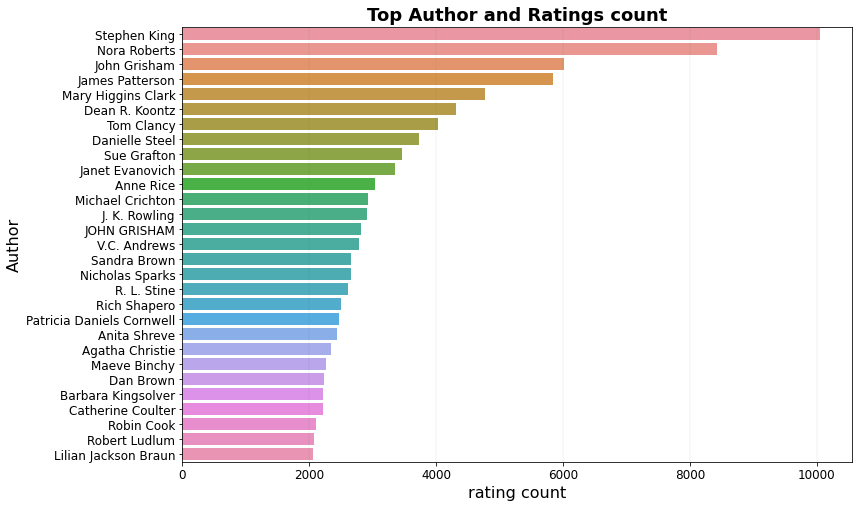

In [89]:
# setting figure size
plt.figure(figsize=(12,8))

#plotting barplot
ax=sns.barplot(author_count[author_count['rating']>1500]['rating'],author_count[author_count['rating']>2000]['author'])

# setting up title
ax.set_title('Top Author and Ratings count', fontsize=18,fontweight='bold')

# setting up x and y label
plt.xlabel("rating count", fontsize = 16)
plt.ylabel("Author", fontsize = 16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# setting grid
plt.grid(axis = 'x',color = 'green', linestyle = '--', linewidth = 0.1)
plt.show()

**Insights:**

when we consider only those author whom book rating count more than 2000 then STEPHANS KING is most popular author followed by Nora Roberts.

In [90]:
rating_count=total_df.groupby(['title'])['rating'].sum().sort_values(ascending=False).reset_index()

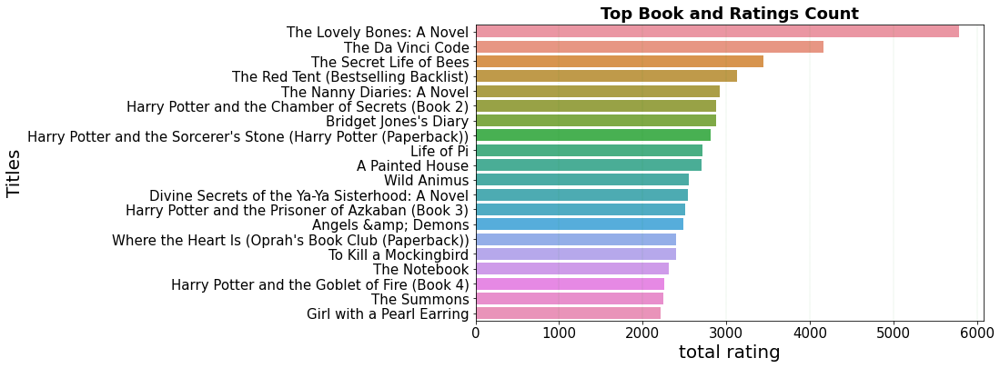

In [91]:
# setting figure size
plt.figure(figsize=(10,6))

#plotting barplot
ax=sns.barplot(rating_count['rating'][:20],rating_count['title'][:20])

# setting up title
ax.set_title('Top Book and Ratings Count', fontsize=18,fontweight='bold')

# setting up x and y label
ax.set_xlabel('total rating',fontsize=20)
ax.set_ylabel('Titles',fontsize=20)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

# setting grid
plt.grid(axis = 'x',color = 'green', linestyle = '--', linewidth = 0.1)

plt.show()

**Insights:**

The lonely Bones:A Nobvel is most rated books followed by The Da Vinci Code.

In [92]:
# Number of outliers
outliers = sum(total_df['Age']>100)
print(outliers)

0


In [93]:
# minimum value of age in age columns
minvalue = total_df['Age'].min()
minvalue

3.0

**Insights:**

minimum age is 3 in dataset

In [94]:
# creating agegroup using age columns
bins= [3,12,20,50,100]
labels = ['Kid','Teen','Adult','old']
total_df['AgeGroup'] = pd.cut(total_df['Age'], bins=bins, labels=labels, right=False)

In [95]:
# creating rating category using rate columns
bins= [0,1,10]
labels = ['Implicit','Explicit']
total_df['rating_cat'] = pd.cut(total_df['rating'], bins=bins, labels=labels, right=False)

In [96]:
total_df.head()

,User-ID,ISBN,rating,title,author,publication_year,Publisher,Location,Age,country,AgeGroup,rating_cat
0,276725,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,"tyler, texas, usa",34.732922,usa,Adult,Implicit
1,2313,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,"cincinnati, ohio, usa",23.000000,usa,Adult,Explicit
2,2313,0812533550,9,Ender's Game (Ender Wiggins Saga (Paperback)),Orson Scott Card,1986,Tor Books,"cincinnati, ohio, usa",23.000000,usa,Adult,Explicit
3,2313,0679745580,8,In Cold Blood (Vintage International),TRUMAN CAPOTE,1994,Vintage,"cincinnati, ohio, usa",23.000000,usa,Adult,Explicit
4,2313,0060173289,9,Divine Secrets of the Ya-Ya Sisterhood : A Novel,Rebecca Wells,1996,HarperCollins,"cincinnati, ohio, usa",23.000000,usa,Adult,Explicit


In [97]:
# total number of mobile phone for different price range
count_df=total_df.AgeGroup.agg(["value_counts"]).sort_index()
count_df

,value_counts
Kid,4073
Teen,30936
Adult,868397
old,127614


**Insights:**

most of the users are in Adult age group followed by old and teen.

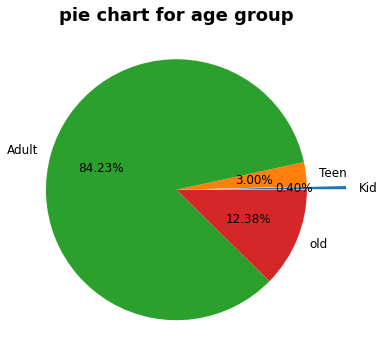

In [98]:
# setting figure size
plt.figure(figsize=(10,6))

# setting label
labels = ['Kid','Teen','Adult','old']

# explode parameter for pie chart 
myexplode = [0.3, 0, 0, 0]

# plotting pie chart
plt.pie(count_df['value_counts'],labels=labels,explode = myexplode, autopct='%.2f%%',textprops={'fontsize': 12})

# setting up title
plt.title('pie chart for age group',fontsize=18, fontweight='bold')

plt.show()

**Insights:**

84.23% of users are in adult age group and 12.38 % users are in old age.

In [99]:
# total number of mobile phone for different price range
cat_df=total_df.	rating_cat.agg(["value_counts"]).sort_index()
cat_df

,value_counts
Implicit,647294
Explicit,312617


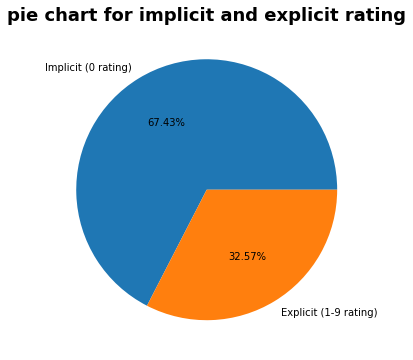

In [100]:
# setting figure size
plt.figure(figsize=(10,6))

# setting up label
labels = ['Implicit (0 rating)', 'Explicit (1-9 rating)']

# plotting pie chart
plt.pie(cat_df['value_counts'],labels=labels, autopct='%.2f%%')

# setting up title
plt.title('pie chart for implicit and explicit rating',fontsize=18, fontweight='bold')



plt.show()

**Insights:**

67.43% users give 0 rating for books and only 32.57 % user are positively rated the books

In [101]:
# separating explicit (1-10) rating  and implicit (0) rating from combined dataset
total_df_implicit=total_df[total_df['rating_cat']=='Implicit']
total_df_explicit=total_df[total_df['rating_cat']=='Explicit']	

In [102]:
# ratings count for each author
auth_rating=total_df.groupby(['author'])['rating'].count().sort_values(ascending=False).reset_index()

In [103]:
auth_rating

,author,rating
0,Stephen King,10053
1,Nora Roberts,8429
2,John Grisham,6010
3,James Patterson,5845
4,Mary Higgins Clark,4777
...,...,...
101584,Chris Prosise,1
101585,Kristie Leigh Maguire,1
101586,Kristie Trabant,1
101587,Kristie. Trabant,1


In [104]:
# # setting figure size
# plt.figure(figsize=(10,6))

# # plotting bar plot
# ax=sns.barplot(auth_rating[auth_rating['rating']>3000]['author'],auth_rating[auth_rating['rating']>3000]['rating'])

# # setting up title
# ax.set_title('Ratings for top authors', fontsize=18 ,fontweight='bold')

# # setting x label
# plt.xticks(fontsize=15,rotation=45)

# # setting grid
# plt.grid(axis = 'y',color = 'green', linestyle = '--', linewidth = 0.1)

# plt.show()

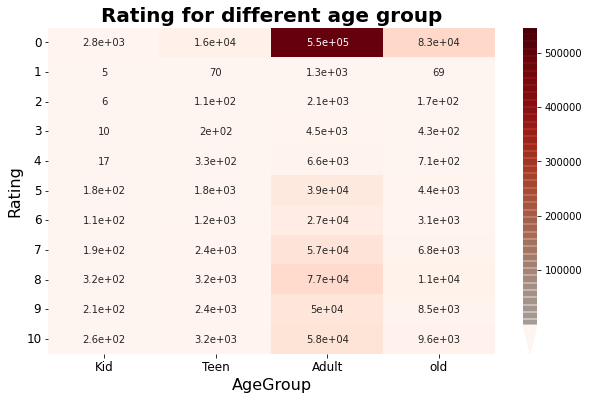

In [105]:
# setting figure size
plt.figure(figsize=(10,6))

# customizing cbar_kws paramwter
cbar_kws = {
            "shrink":1,
            'extend':'min', 
            'extendfrac':0.1,            
            "drawedges":True,
           }

# plotting heatmap using seaborn
sns.heatmap(pd.crosstab(total_df.rating,total_df.AgeGroup),cmap='Reds',annot = True,cbar_kws=cbar_kws,alpha=1)

# setting up title
plt.title('Rating for different age group',fontsize=20,fontweight='bold')

# setting up label
plt.xlabel("AgeGroup", fontsize=16)
plt.ylabel("Rating", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12, rotation=0)
plt.show()


**Insights:**

* most of the user who rate the book are from adult age group.
* the age group who rate down are  from adult age group.

In [106]:
exp_count=total_df_explicit.groupby(['rating','author']).size()


In [107]:
expl_count=total_df_explicit.groupby('author').mean().reset_index().sort_values('User-ID', ascending= False).reset_index().head(10)


In [108]:
#Identifying what % of customers are coming from different countries
df_location = pd.DataFrame(total_df.country.value_counts(normalize=True)).reset_index()
df_location.columns = ['countries','value_counts']

#Labeling countries with low customer % as other
df_location['countries'] = df_location.apply(lambda x: 'rest of world' if (x['value_counts'] < 0.015 or x['countries'] == '') else x['countries'],axis=1)

#Grouping the customer % from 'other' countries 
df_location = df_location.groupby('countries')['value_counts'].sum().reset_index()

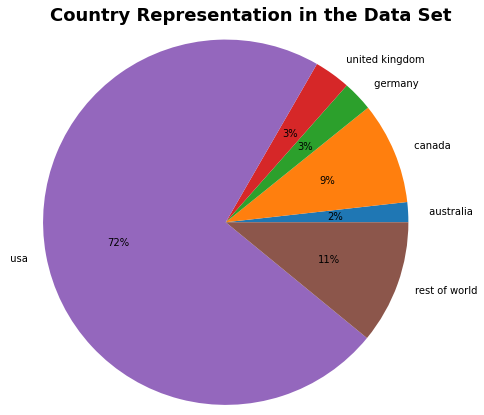

In [109]:
# setting figure size
plt.figure(figsize=(10,6))

#create pie chart
plt.pie(df_location['value_counts'], labels = df_location['countries'], autopct='%.0f%%',radius=1.4)

# setting up title
plt.title("Country Representation in the Data Set",fontsize=18, fontdict={"weight": "bold"},y=1.1,x=0.578)
plt.show()

**Insights:**

72% of books reader from usa and 9% from canada.

In [110]:
# rating count for top 20 authors
top_author=total_df.groupby(['author'])['rating'].count().sort_values(ascending=False).reset_index().head(20)


In [111]:
# merging these top 20 author with combine datframe
top_author = top_author.merge(total_df,how='inner',on='author')

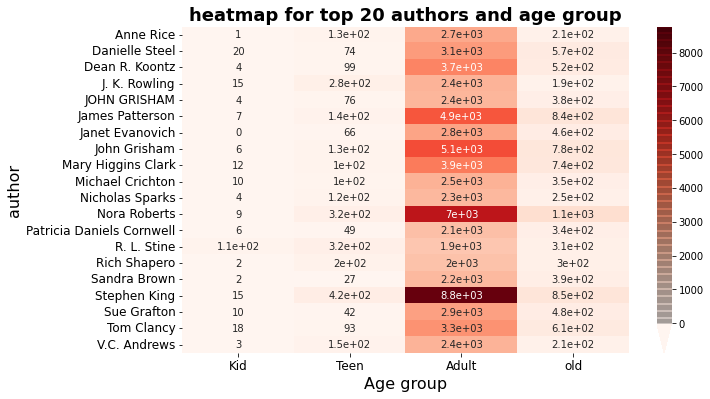

In [112]:
# setting figure size
plt.figure(figsize=(10,6))

# plotting heatmap using seaborn
sns.heatmap(pd.crosstab(top_author.author,top_author.AgeGroup),cmap='Reds',annot = True,cbar_kws=cbar_kws,alpha=1)

# setting up title
plt.title('heatmap for top 20 authors and age group',fontsize=18,fontweight='bold')

# setting up x and y label
plt.xlabel("Age group", fontsize = 16)
plt.ylabel("author", fontsize = 16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.show()

**Insights:**

* Most of the book reader from adult age group.
* Stephans king get most of the rating.

In [113]:
# rating count for top 20 books
top_book=total_df.groupby(['title'])['rating'].count().sort_values(ascending=False).reset_index().head(20)


In [114]:
# merging top 20 book dataframe with combines dataframe
top_book=top_book.merge(total_df,how='inner',on='title')

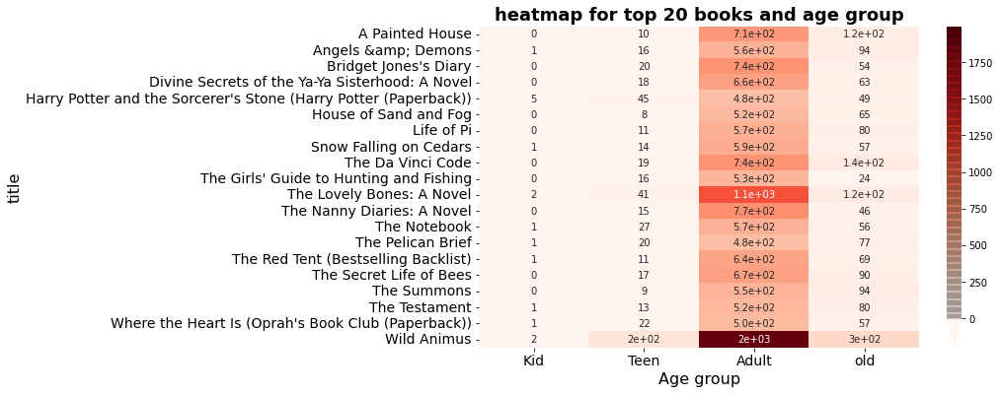

In [115]:
# setting figure size
plt.figure(figsize=(10,6))

# plotting heatmap using seaborn
sns.heatmap(pd.crosstab(top_book.title,top_book.AgeGroup),cmap='Reds',annot = True,cbar_kws=cbar_kws,alpha=1)

# setting up title
plt.title('heatmap for top 20 books and age group',fontsize=18,fontweight='bold')

# setting up x and y label
plt.xlabel("Age group", fontsize = 16)
plt.ylabel("title", fontsize = 16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.show()

**Insights:**

wild animus is popular among all the four age group.

In [116]:
top_country=total_df.groupby(['country'])['rating'].count().sort_values(ascending=False).reset_index().head(20)


In [117]:
total_df.columns

Index(['User-ID', 'ISBN', 'rating', 'title', 'author', 'publication_year',
       'Publisher', 'Location', 'Age', 'country', 'AgeGroup', 'rating_cat'],
      dtype='object')

#**Building Model**

##    ****Popularity based recommendation system****

### **1. weighted average method(IMDB formula)**

In [118]:
# Create column Rating average with exlpicit rating (excluding zero rating)
total_df_explicit['Rating_average']=total_df_explicit.groupby('ISBN')['rating'].transform('mean')

# Create column Rating sum with exlpicit rating (excluding zero rating)
total_df_explicit['No_Of_Users_Rated']=total_df_explicit.groupby('ISBN')['rating'].transform('count')

In [119]:
total_df_explicit.head()

,User-ID,ISBN,rating,title,author,publication_year,Publisher,Location,Age,country,AgeGroup,rating_cat,Rating_average,No_Of_Users_Rated
1,2313,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,"cincinnati, ohio, usa",23.0,usa,Adult,Explicit,6.148148,27
2,2313,0812533550,9,Ender's Game (Ender Wiggins Saga (Paperback)),Orson Scott Card,1986,Tor Books,"cincinnati, ohio, usa",23.0,usa,Adult,Explicit,8.600000,5
3,2313,0679745580,8,In Cold Blood (Vintage International),TRUMAN CAPOTE,1994,Vintage,"cincinnati, ohio, usa",23.0,usa,Adult,Explicit,7.733333,15
4,2313,0060173289,9,Divine Secrets of the Ya-Ya Sisterhood : A Novel,Rebecca Wells,1996,HarperCollins,"cincinnati, ohio, usa",23.0,usa,Adult,Explicit,7.000000,47
5,2313,0385482388,5,The Mistress of Spices,Chitra Banerjee Divakaruni,1998,Anchor Books/Doubleday,"cincinnati, ohio, usa",23.0,usa,Adult,Explicit,7.000000,38


In [120]:
# creating rating mean and rating count on combined dataframe using groupby mean
rating_count = total_df.groupby('title')['rating'].count()
rating_mean = total_df.groupby('title')['rating'].mean()

In [121]:
# calculating parameter for IMDB formula
C= total_df_explicit['Rating_average'].mean()
m= total_df_explicit['No_Of_Users_Rated'].quantile(0.90)
recommended_Books = total_df_explicit.loc[total_df_explicit['No_Of_Users_Rated'] >= m]
print(f'C={C} , m={m}')
recommended_Books.shape

C=7.085980608860042 , m=52.0


(31537, 14)

In [122]:
# creating function to calculate score according to IMDB formula
def weighted_rating(x, m=m, C=C):
    v = x['No_Of_Users_Rated']
    R = x['Rating_average']
    return (R*v+C*m)/(m+v)

# creating new feature score 
recommended_Books['Score'] = recommended_Books.apply(weighted_rating,axis=1)
 
#Sorting books based on score calculated above
recommended_Books = recommended_Books.sort_values('Score', ascending=False)

In [123]:
#Keeping only one entry of each book
recommended_Books=recommended_Books.sort_values('Score', ascending=False).drop_duplicates('ISBN').sort_index()

# creating sequential palette that blends from light to color.
cm=sns.color_palette("dark:salmon_r", as_cmap=True)

#Sorting books based on score calculated above
recommended_Books = recommended_Books.sort_values('Score', ascending=False)

# displaying recommended book
print('recommended book based on weighted average method')

#Printing the top 10 books
recommended_Books[['title','author','AgeGroup', 'No_Of_Users_Rated', 'Rating_average', 'Score']].reset_index(drop=True).head(10).style.background_gradient(cmap=cm)

recommended book based on weighted average method


,title,author,AgeGroup,No_Of_Users_Rated,Rating_average,Score
0,Harry Potter and the Chamber of Secrets (Book 2),J. K. Rowling,old,118,8.050847,7.755712
1,Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback)),J. K. Rowling,Adult,161,7.937888,7.729911
2,The Secret Life of Bees,Sue Monk Kidd,Adult,221,7.850679,7.705022
3,The Bean Trees,Barbara Kingsolver,Adult,88,8.034091,7.681936
4,Fahrenheit 451,RAY BRADBURY,Adult,109,7.935780,7.661311
5,The Joy Luck Club,Amy Tan,Adult,162,7.839506,7.656407
6,To Kill a Mockingbird,Harper Lee,Adult,109,7.926606,7.655099
7,The Lovely Bones: A Novel,Alice Sebold,Teen,559,7.704830,7.652162
8,Ender's Game (Ender Wiggins Saga (Paperback)),Orson Scott Card,Adult,70,8.057143,7.643205
9,Harry Potter and the Prisoner of Azkaban (Book 3),J. K. Rowling,Adult,64,8.093750,7.641991


**Insights:**

when we consider weighted average methods:
* out of top 10 books, only 1 books are popular among teen rest of them are popular for adult and old age group.
* Harry Potter and the Chamber of Secrets (Book 2) is getting maximum score.
* out of top 10 books,3 books are book written by J. K. Rowling is more popular.
* The Lovely Bones: A Novel wrtten by Alice sebold is more popular among teen and it is rated by maximum number of users.


### **2. recommendation based on rating count**

In [124]:
# previewing combine(contains both explicit and implicit rating) dataframe
total_df.head()

,User-ID,ISBN,rating,title,author,publication_year,Publisher,Location,Age,country,AgeGroup,rating_cat
0,276725,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,"tyler, texas, usa",34.732922,usa,Adult,Implicit
1,2313,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,"cincinnati, ohio, usa",23.000000,usa,Adult,Explicit
2,2313,0812533550,9,Ender's Game (Ender Wiggins Saga (Paperback)),Orson Scott Card,1986,Tor Books,"cincinnati, ohio, usa",23.000000,usa,Adult,Explicit
3,2313,0679745580,8,In Cold Blood (Vintage International),TRUMAN CAPOTE,1994,Vintage,"cincinnati, ohio, usa",23.000000,usa,Adult,Explicit
4,2313,0060173289,9,Divine Secrets of the Ya-Ya Sisterhood : A Novel,Rebecca Wells,1996,HarperCollins,"cincinnati, ohio, usa",23.000000,usa,Adult,Explicit


In [125]:
# calculating rating count for each book title
rating_count_df = total_df.groupby('title').count()['rating'].reset_index()

# rename the column
rating_count_df .rename(columns={'rating':'rating count'},inplace=True)
rating_count_df 

,title,rating count
0,A Light in the Storm: The Civil War Diary of ...,4
1,Always Have Popsicles,1
2,Apple Magic (The Collector's series),1
3,"Ask Lily (Young Women of Faith: Lily Series, ...",1
4,Beyond IBM: Leadership Marketing and Finance ...,1
...,...,...
241066,Ã?Â?lpiraten.,2
241067,Ã?Â?rger mit Produkt X. Roman.,4
241068,Ã?Â?sterlich leben.,1
241069,Ã?Â?stlich der Berge.,3


In [126]:
# calculating average rating for each book title
avg_rating_df = total_df.groupby('title').mean()['rating'].reset_index()

# rename the columns
avg_rating_df.rename(columns={'rating':'avg_rating'},inplace=True)
avg_rating_df

,title,avg_rating
0,A Light in the Storm: The Civil War Diary of ...,2.250000
1,Always Have Popsicles,0.000000
2,Apple Magic (The Collector's series),0.000000
3,"Ask Lily (Young Women of Faith: Lily Series, ...",8.000000
4,Beyond IBM: Leadership Marketing and Finance ...,0.000000
...,...,...
241066,Ã?Â?lpiraten.,0.000000
241067,Ã?Â?rger mit Produkt X. Roman.,5.250000
241068,Ã?Â?sterlich leben.,7.000000
241069,Ã?Â?stlich der Berge.,2.666667


In [127]:
# merging average rating dataframe and rating count dataframe on title
popular_df = rating_count_df.merge(avg_rating_df,on='title')
popular_df

,title,rating count,avg_rating
0,A Light in the Storm: The Civil War Diary of ...,4,2.250000
1,Always Have Popsicles,1,0.000000
2,Apple Magic (The Collector's series),1,0.000000
3,"Ask Lily (Young Women of Faith: Lily Series, ...",1,8.000000
4,Beyond IBM: Leadership Marketing and Finance ...,1,0.000000
...,...,...,...
241066,Ã?Â?lpiraten.,2,0.000000
241067,Ã?Â?rger mit Produkt X. Roman.,4,5.250000
241068,Ã?Â?sterlich leben.,1,7.000000
241069,Ã?Â?stlich der Berge.,3,2.666667


In [128]:
# sort the dataframe according to rating count 
rating_count_sort= popular_df.sort_values(by = 'rating count',ascending= False)
rating_count_sort

,title,rating count,avg_rating
234951,Wild Animus,2502,1.019584
196326,The Lovely Bones: A Novel,1295,4.468726
183573,The Da Vinci Code,898,4.642539
5303,A Painted House,838,3.231504
199237,The Nanny Diaries: A Novel,828,3.530193
...,...,...,...
147559,Real Love: The Truth About Finding Uncondition...,1,0.000000
147558,Real Love: The Drawings for Sean,1,10.000000
147557,"Real Love or Fake (Camfield Novel of Love, No 78)",1,5.000000
63664,Fabulous Food for Family and Friends: Healthy ...,1,0.000000


**Insights:**

from the above result, it is observe that
* maximum rating count book have average rating is 1.02
* minimum rating count book have average rating is 0

In [129]:
# sort the dataframe according to average rating  
rating_avg_sort= popular_df.sort_values(by = 'avg_rating',ascending= False)
rating_avg_sort

,title,rating count,avg_rating
66223,Film Is: The International Free Cinema,1,10.0
123125,More Secrets of Happy Children: Embrace Your P...,1,10.0
96558,Jo's Boys : From the Original Publisher,1,10.0
212107,The Vanished Priestess : An Annie Szabo Mystery,1,10.0
72503,Game and Hunting,1,10.0
...,...,...,...
93628,Invaders of the Planet Earth (Choose Your Own ...,1,0.0
154021,Sammy Discovers the Alphabet (Learn-With-Sammy),1,0.0
154019,Sammy Carducci's Guide to Women,2,0.0
154018,Sammle mir Kiesel am FluÃ?Â?. Mehr als eine Li...,1,0.0


**Insights:**

1. When we sort the data according to average rating it is observe that:
* maximum average rating ( i.e. 10 ) book have rating count is 1.
* minimum average rating ( i.e. 10 ) book have rating count is 1.

2. hence, to avoid this problem we have to select some threshold value.

3. let us consider only those book which have rating count more than 30.

In [130]:
# filtering those data which have rating count more than 30
popular_df = popular_df[popular_df['rating count']>=30].sort_values('avg_rating',ascending=False).reset_index()
popular_df=popular_df.rename({'index': 'User-ID'}, axis=1)

In [131]:
popular_df.head()

,User-ID,title,rating count,avg_rating
0,70396,Free,56,8.017857
1,233398,Where the Sidewalk Ends : Poems and Drawings,33,7.121212
2,112160,Love You Forever,48,6.791667
3,64207,Falling Up,39,6.743590
4,96823,Johnny Got His Gun,34,6.588235


In [132]:
popular_df.tail()

,User-ID,title,rating count,avg_rating
4669,9219,Acts of Love,43,0.581395
4670,183471,"The Curse of the Mummy's Tomb (Goosebumps, No 5)",33,0.575758
4671,218017,Thornyhold,34,0.558824
4672,172105,"Tall, Dark, and Deadly",34,0.529412
4673,202344,The Plan,33,0.515152


In [133]:
popular_df

,User-ID,title,rating count,avg_rating
0,70396,Free,56,8.017857
1,233398,Where the Sidewalk Ends : Poems and Drawings,33,7.121212
2,112160,Love You Forever,48,6.791667
3,64207,Falling Up,39,6.743590
4,96823,Johnny Got His Gun,34,6.588235
...,...,...,...,...
4669,9219,Acts of Love,43,0.581395
4670,183471,"The Curse of the Mummy's Tomb (Goosebumps, No 5)",33,0.575758
4671,218017,Thornyhold,34,0.558824
4672,172105,"Tall, Dark, and Deadly",34,0.529412


**Insights:**

When we see last 5 rows in dataframe, it is found that rating count is more than 30 but average rating is close to 0.5.
* lower average rating mean user not wanted to read this book hence it can not be recommended.
* To avoid this, we will consider another threshold value for average rating.let us consider we will recommend only those book which have average rating atleast 5.

In [134]:
# filtering books having rating more than 4
popular_df = popular_df[popular_df['avg_rating']>=5].sort_values('avg_rating',ascending=False)

# displaying top 5 recommended book
print('top 5 book according to user rating \n\n',popular_df.head() )

top 5 book according to user rating 

    User-ID                                         title  rating count  \
0    70396                                          Free            56   
1   233398  Where the Sidewalk Ends : Poems and Drawings            33   
2   112160                              Love You Forever            48   
3    64207                                    Falling Up            39   
4    96823                            Johnny Got His Gun            34   

   avg_rating  
0    8.017857  
1    7.121212  
2    6.791667  
3    6.743590  
4    6.588235  


## **3. Model based collaborative filtering**

In [135]:
# considering only those user who rated atleast 1 (explicit rating) and checking total number of records
user_ratings_threshold = 1

filter_users =total_df_explicit['User-ID'].value_counts()
filter_users_list = filter_users[filter_users >= user_ratings_threshold].index.to_list()

df_ratings_top = total_df_explicit[total_df_explicit['User-ID'].isin(filter_users_list)]

print('Filter: users with at least %d ratings\nNumber of records: %d' % (user_ratings_threshold, len(df_ratings_top)))

Filter: users with at least 1 ratings
Number of records: 312617


In [136]:
# checking rows and columns of dataframe
total_df_explicit.shape

(312617, 14)

In [137]:
# considering only top 10% rated book and checking total number of records
book_ratings_threshold_perc = 0.1
book_ratings_threshold = len(df_ratings_top['ISBN'].unique()) * book_ratings_threshold_perc

filter_books_list = df_ratings_top['ISBN'].value_counts().head(int(book_ratings_threshold)).index.to_list()
df_ratings_top = df_ratings_top[df_ratings_top['ISBN'].isin(filter_books_list)]

print('Filter: top %d%% most frequently rated books\nNumber of records: %d' % (book_ratings_threshold_perc*100, len(df_ratings_top)))

Filter: top 10% most frequently rated books
Number of records: 154557


In [138]:


# # Importing libraries for model building & evaluation
# from sklearn.model_selection import train_test_split
# from surprise import Reader, Dataset
# from surprise.model_selection import train_test_split, cross_validate, GridSearchCV
# from surprise import KNNBasic, KNNWithMeans, KNNWithZScore, KNNBaseline, SVD
# from surprise import accuracy

In [139]:
# importing surprise library
from surprise import Dataset, Reader
from surprise import SVD, NMF
from surprise.model_selection import cross_validate, train_test_split, GridSearchCV

In [140]:
df=df_ratings_top.copy()
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(df[['User-ID', 'ISBN', 'rating',]], reader)


In [141]:
models=[NMF(),SVD()] 
results = {}

for model in models:
    # perform 5 fold cross validation
    # evaluation metrics: mean absolute error & root mean square error
    CV_scores = cross_validate(model, data, measures=["MAE","RMSE"], cv=5, n_jobs=-1)  
    
    # storing the average score across the 5 fold cross validation for each model
    result = pd.DataFrame.from_dict(CV_scores).mean(axis=0).\
             rename({'test_mae':'MAE', 'test_rmse': 'RMSE'})
    results[str(model).split("algorithms.")[1].split("object ")[0]] = result

In [142]:
# creating result dataframe
performance_df = pd.DataFrame.from_dict(results)
print("Model Performance: \n")
performance_df.T.sort_values(by='RMSE')

Model Performance: 



,MAE,RMSE,fit_time,test_time
matrix_factorization.SVD,1.134055,1.462899,7.305095,0.271217
matrix_factorization.NMF,1.835682,2.196971,10.963374,0.252846


**Insights:**

Optimal model are those which are more accurate and lower training/testing time.
from above table it is observe that:

For the given dataset much better results can be obtained with SVD approach - both in terms of accuracy and training / testing time.

In [143]:
# selecting best parameter using GridSearchCV
# param_grid for GridSearchCV
param_grid = {"n_factors": range(20,100,20),             # the number of factors
              "n_epochs" : [5, 10, 20],                  # the number of iteration of the SGD procedure
              "lr_all"   : [0.002, 0.005],               # the learning rate for all parameters
              "reg_all"  : [0.2, 0.4]}                   # the regularization term for all parameters
# Hyperparameter tuning
SVD_opt = GridSearchCV(SVD, param_grid, measures=['mae', 'rmse'], cv=5, n_jobs=-1)

#train the model
SVD_opt.fit(data)

In [144]:
# displaying best parameter and best score for MAE and RMSE
print(f'MAE Best Parameters:  {SVD_opt.best_params["mae"]}')
print(f'MAE Best Score:       {SVD_opt.best_score["mae"]}\n')

print(f'RMSE Best Parameters: {SVD_opt.best_params["rmse"]}')
print(f'RMSE Best Score:      {SVD_opt.best_score["rmse"]}\n')

MAE Best Parameters:  {'n_factors': 20, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.2}
MAE Best Score:       1.1324276008541667

RMSE Best Parameters: {'n_factors': 20, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.2}
RMSE Best Score:      1.455146796705915



In [145]:
# splittting the data into test and train data
train_data, test_data = train_test_split(data, test_size=0.25)

# creating model
SVD_opt_model=SVD(n_factors=20, n_epochs=20, lr_all=0.005, reg_all= 0.2)

# model training
SVD_opt_model.fit(train_data)


In [146]:
# predict the result
predictions=SVD_opt_model.test(test_data)

In [147]:
# splittting the data into test and train data
# train_data, test_data = train_test_split(data, test_size=0.25)

In [148]:
# predictions

In [149]:
df_pred = pd.DataFrame(predictions, columns=['User-ID', 'ISBN', 'actual_rating', 'pred_rating', 'details'])
df_pred['impossible'] = df_pred['details'].apply(lambda x: x['was_impossible'])
df_pred['pred_rating_round'] = df_pred['pred_rating'].round()
df_pred['abs_err'] = abs(df_pred['pred_rating'] - df_pred['actual_rating'])
df_pred.drop(['details'], axis=1, inplace=True)
df_pred.sample(5)

,User-ID,ISBN,actual_rating,pred_rating,impossible,pred_rating_round,abs_err
26121,19725,0553279378,8.0,7.149279,False,7.0,0.850721
14137,65913,0553574108,9.0,7.477248,False,7.0,1.522752
8142,81234,0345351959,5.0,7.076779,False,7.0,2.076779
11296,197828,0151008116,8.0,7.625664,False,8.0,0.374336
31322,173654,0515120618,9.0,7.134261,False,7.0,1.865739


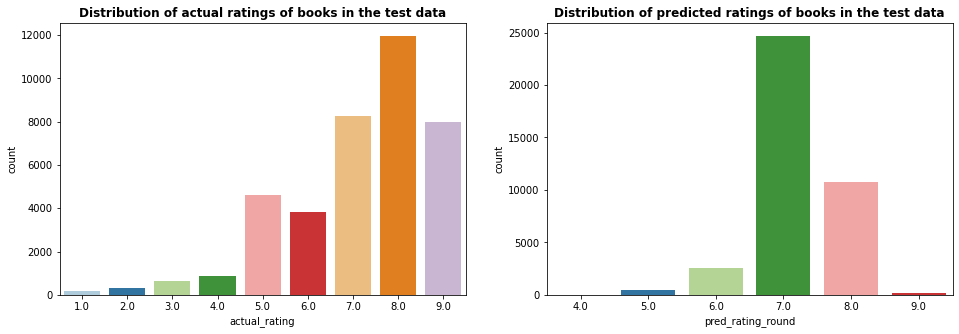

In [150]:
#creating subplot
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))

# selecting color palette
palette = sns.color_palette("Paired")

# plotting count plot 
sns.countplot(x='actual_rating', data=df_pred, palette=palette, ax=ax1)

# setting title
ax1.set_title('Distribution of actual ratings of books in the test data', fontdict= {'weight': 'bold',
                          'size': 12,})

# # setting up x and y label
# ax1.set_xlabel("actual_rating", fontsize = 16)
# ax1.set_ylabel("Count", fontsize = 16)

# plotting countplot
sns.countplot(x='pred_rating_round', data=df_pred, palette=palette, ax=ax2)
ax2.set_title('Distribution of predicted ratings of books in the test data' ,
              fontdict= {'weight': 'bold',
                          'size': 12,})

# # setting up x and y label
# ax2.set_xlabel("predicted rating", fontsize = 16)
# ax2.set_ylabel("Count", fontsize = 16)

plt.show()

**Insights:**

The diagram shows comparison of actual and predicted ratings of books for test data:
* According to the distribution of actual ratings of books in the test set, the biggest part of users rated the book between 7 and 10. The mode equals 8 but count of ratings 7, 9, 10 is also noticeable.

* The distribution of predicted ratings in the test set is visibly different. One more time, 7 is a mode but scores 6, 9 and 10 are clearly less frequent.

It shows that the recommender system is not perfect and it cannot reflect the real distribution of book ratings.

In [151]:
df_pred.groupby('actual_rating').mean()['abs_err']

actual_rating
1.0    5.536150
2.0    4.671354
3.0    3.837784
4.0    2.880962
5.0    1.817333
6.0    1.105069
7.0    0.386236
8.0    0.698475
9.0    1.548376
Name: abs_err, dtype: float64

In [152]:
df_pred_density=df_pred[['actual_rating','abs_err']]
df_pred_density.groupby('actual_rating').mean()

,abs_err
actual_rating,
1.0,5.536150
2.0,4.671354
3.0,3.837784
4.0,2.880962
5.0,1.817333
6.0,1.105069
7.0,0.386236
8.0,0.698475
9.0,1.548376


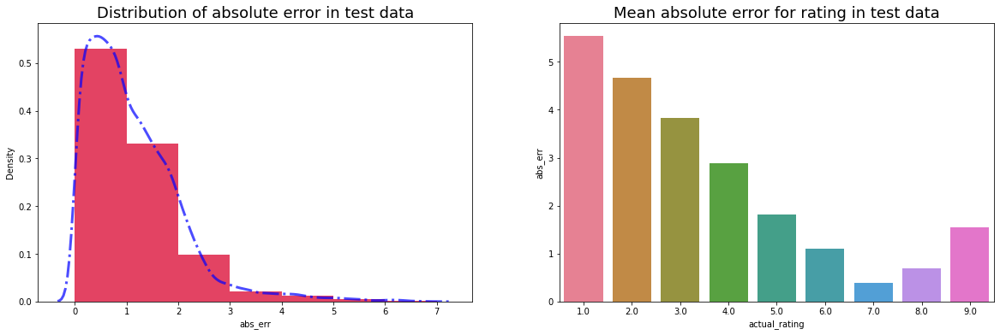

In [153]:
# calculating mean absolute reeor
df_pred_err = df_pred.groupby('actual_rating')['abs_err'].mean().reset_index()

# creating subplot
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,6))


bins = [0,1,2,3,4,5,6,7]
# plotting distribution plot for absolute error in test data
# sns.distplot(df_pred['abs_err'], color='seagreen', ax=ax1, bins=bins)

# hist keyword argument to change hist format
sns.distplot(df_pred['abs_err'],
            hist_kws = {'color':'#DC143C',
                        'alpha':0.8},bins=bins,
            kde_kws = {'color':'b', 
                       'linewidth':3, 'linestyle':'-.', 'alpha':0.7} 
             , ax=ax1
             )

# setting title
ax1.set_title('Distribution of absolute error in test data',fontsize=18)

# plotting barplot between absolute error and predicted rating
sns.barplot(x='actual_rating', y='abs_err', data=df_pred_err, palette='husl', ax=ax2)

# setting title
ax2.set_title('Mean absolute error for rating in test data',fontsize=18)

plt.show()

**Insights:**

from above diagram, it is depicting that:
* The distribution of absolute errors is right-skewed, showing that the majority of errors is lies between 0 and 1. There is a long tail that indicates that there are several observations for which the absolute error was close to 10.
* From **distribution of actual and predicted ratings of books for test data diagram**, 8 is the most frequent rating for prediction. and from above **Mean absolute error for rating in test data** it is observing that absolute error is more than 5 for actual rating 1, with increase in rating absolute error start decreasing linearly upto 7 beyond this value absolute error increases.

* For actual rating of 7, absolute error is minimum.

* the model deals very well with predicting rating value 8 (the most frequent value). The biggest errors happen to observations with scores 1 or 2 which indicates that probably the model is predicting high ratings for those observations.

In [154]:
# rating dataframe and books dataframe on ISBN
df_ext = ratings_df.merge(books_df[['ISBN', 'title']], on='ISBN', how='left')
df_ext = df_ext.merge(df_pred[['ISBN', 'User-ID', 'pred_rating']], on=['ISBN', 'User-ID'], how='left')

In [155]:
selected_user_id = 2313
df_user = df_ext[df_ext['User-ID']==selected_user_id]
df_user[(df_user['pred_rating'].isna())&(df_user['rating']>=9)].sample

<bound method NDFrame.sample of        User-ID        ISBN  rating  \
15426     2313  0060173289       9   
15432     2313  0345348036       9   
15435     2313  0385470142       9   
15437     2313  0394756827      10   
15443     2313  0452260116       9   
15456     2313  0812533550       9   

                                                   title  pred_rating  
15426   Divine Secrets of the Ya-Ya Sisterhood : A Novel          NaN  
15432  The Princess Bride: S Morgenstern's Classic Ta...          NaN  
15435  Fires in the Mirror: Crown Heights, Brooklyn a...          NaN  
15437       Godel, Escher, Bach: An Eternal Golden Braid          NaN  
15443    Song of Solomon (Oprah's Book Club (Paperback))          NaN  
15456      Ender's Game (Ender Wiggins Saga (Paperback))          NaN  >

In [156]:
print('actual top 5 rated books on test data \n')
df_user[df_user['pred_rating'].notna()].sort_values('pred_rating', ascending=False).head(5)

actual top 5 rated books on test data 



,User-ID,ISBN,rating,title,pred_rating
15425,2313,0020442602,9,Voyage of the Dawn Treader,7.345379
15451,2313,0679745580,8,In Cold Blood (Vintage International),7.201374
15460,2313,0879520388,7,Science and Health with Key to the Scriptures ...,6.935566
15433,2313,034545104X,5,Flesh Tones: A Novel,6.769856


In [157]:
print('predicted top 5 rated books on test data \n')
df_user[df_user['pred_rating'].notna()].sort_values('rating', ascending=False).head(5)

predicted top 5 rated books on test data 



,User-ID,ISBN,rating,title,pred_rating
15425,2313,0020442602,9,Voyage of the Dawn Treader,7.345379
15451,2313,0679745580,8,In Cold Blood (Vintage International),7.201374
15460,2313,0879520388,7,Science and Health with Key to the Scriptures ...,6.935566
15433,2313,034545104X,5,Flesh Tones: A Novel,6.769856


## **4.Content based filtering**

In [158]:
total_df_explicit.head()

,User-ID,ISBN,rating,title,author,publication_year,Publisher,Location,Age,country,AgeGroup,rating_cat,Rating_average,No_Of_Users_Rated
1,2313,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,"cincinnati, ohio, usa",23.0,usa,Adult,Explicit,6.148148,27
2,2313,0812533550,9,Ender's Game (Ender Wiggins Saga (Paperback)),Orson Scott Card,1986,Tor Books,"cincinnati, ohio, usa",23.0,usa,Adult,Explicit,8.600000,5
3,2313,0679745580,8,In Cold Blood (Vintage International),TRUMAN CAPOTE,1994,Vintage,"cincinnati, ohio, usa",23.0,usa,Adult,Explicit,7.733333,15
4,2313,0060173289,9,Divine Secrets of the Ya-Ya Sisterhood : A Novel,Rebecca Wells,1996,HarperCollins,"cincinnati, ohio, usa",23.0,usa,Adult,Explicit,7.000000,47
5,2313,0385482388,5,The Mistress of Spices,Chitra Banerjee Divakaruni,1998,Anchor Books/Doubleday,"cincinnati, ohio, usa",23.0,usa,Adult,Explicit,7.000000,38


In [159]:
data_df = pd.DataFrame(total_df_explicit['title'].value_counts())
data_df['ratings count'] =data_df['title']
data_df['title'] =data_df.index
data_df.reset_index(level=0, inplace=True)
data_df= data_df.drop('index',axis=1)


data_df= total_df_explicit.merge(data_df, left_on = 'title', right_on = 'title', how = 'left')
data_df= data_df.drop(['Publisher','publication_year','Age','country'], axis=1)

In [160]:
print(data_df['No_Of_Users_Rated'].quantile(np.arange(.9,1,.01)))

0.90     52.0
0.91     57.0
0.92     64.0
0.93     70.0
0.94     80.0
0.95     93.0
0.96    111.0
0.97    130.0
0.98    162.0
0.99    221.0
Name: No_Of_Users_Rated, dtype: float64


**Assumption**

considering 10% of data
hence popularity threshold is 52

In [161]:
popularity_threshold =52
popular_book = data_df[data_df['ratings count'] >= popularity_threshold]
popular_book = popular_book.reset_index(drop = True)

In [162]:
popular_book.head()

,User-ID,ISBN,rating,title,author,Location,AgeGroup,rating_cat,Rating_average,No_Of_Users_Rated,ratings count
0,2313,0812533550,9,Ender's Game (Ender Wiggins Saga (Paperback)),Orson Scott Card,"cincinnati, ohio, usa",Adult,Explicit,8.600000,5,87
1,2313,0399146431,5,The Bonesetter's Daughter,Amy Tan,"cincinnati, ohio, usa",Adult,Explicit,7.928571,42,141
2,2313,0399141146,3,The Hundred Secret Senses,Amy Tan,"cincinnati, ohio, usa",Adult,Explicit,7.142857,21,101
3,6543,0345342968,8,Fahrenheit 451,RAY BRADBURY,"strafford, missouri, usa",Adult,Explicit,7.935780,109,137
4,6543,0446610038,9,1st to Die: A Novel,James Patterson,"strafford, missouri, usa",Adult,Explicit,7.406452,155,206


In [163]:

from collections import Counter
from scipy.sparse import csr_matrix
from pandas.api.types import is_numeric_dtype
from sklearn.neighbors import NearestNeighbors
from sklearn.feature_extraction import DictVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfVectorizer

In [164]:
#creating model object
tf = TfidfVectorizer(ngram_range=(1, 2), min_df = 1, stop_words='english')

# traininhg the model
tfidf_matrix = tf.fit_transform(popular_book['title'])

# previewing the size of dataframe
tfidf_matrix.shape

(43710, 1487)

In [165]:
popular_book.index[popular_book['ISBN'] == 'ISBN'].tolist()

[]

In [166]:
from sklearn.metrics.pairwise import linear_kernel
cosine_similarities = linear_kernel(tfidf_matrix, tfidf_matrix)

In [167]:
# taking input from user
bookName=input('Enter book name:-')

print("Recommended Books according to content given in this book are:\n")
isbn = data_df.loc[data_df['title'] == bookName].reset_index(drop = True).iloc[0]['ISBN']
content = []

idx = popular_book.index[popular_book['ISBN'] == isbn].tolist()[0]
similar_indices = cosine_similarities[idx].argsort()[::-1]
similar_items = []
for i in similar_indices:
    if popular_book['title'][i] != bookName and popular_book['title'][i] not in similar_items and len(similar_items) < 10:
        similar_items.append(popular_book['title'][i])
        content.append(popular_book['title'][i])

for book in similar_items:
    print(book)

Enter book name:-Fahrenheit 451
Recommended Books according to content given in this book are:

Fried Green Tomatoes at the Whistle Stop Cafe
Ender's Game (Ender Wiggins Saga (Paperback))
From the Corner of His Eye
Violets Are Blue
On the Street Where You Live
Message in a Bottle
The Jester
The Bluest Eye
The Summons
The Partner


## **5.Memory based collaborative filtering using NearestNeighbours**

In [168]:
# previewing combine explicit dataframe
total_df_explicit.head()

,User-ID,ISBN,rating,title,author,publication_year,Publisher,Location,Age,country,AgeGroup,rating_cat,Rating_average,No_Of_Users_Rated
1,2313,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,"cincinnati, ohio, usa",23.0,usa,Adult,Explicit,6.148148,27
2,2313,0812533550,9,Ender's Game (Ender Wiggins Saga (Paperback)),Orson Scott Card,1986,Tor Books,"cincinnati, ohio, usa",23.0,usa,Adult,Explicit,8.600000,5
3,2313,0679745580,8,In Cold Blood (Vintage International),TRUMAN CAPOTE,1994,Vintage,"cincinnati, ohio, usa",23.0,usa,Adult,Explicit,7.733333,15
4,2313,0060173289,9,Divine Secrets of the Ya-Ya Sisterhood : A Novel,Rebecca Wells,1996,HarperCollins,"cincinnati, ohio, usa",23.0,usa,Adult,Explicit,7.000000,47
5,2313,0385482388,5,The Mistress of Spices,Chitra Banerjee Divakaruni,1998,Anchor Books/Doubleday,"cincinnati, ohio, usa",23.0,usa,Adult,Explicit,7.000000,38


In [169]:
# considering only those data which have minimum rating is 3
user_ratings_threshold = 3
filter_users = total_df_explicit['title'].unique
filter_users = total_df_explicit['title'].value_counts()

# filter out user who rated 3 or more
filter_users_list = filter_users[filter_users >= user_ratings_threshold].index.to_list()
poplr_df = total_df_explicit[total_df_explicit['title'].isin(filter_users_list)]

In [170]:
# considering threshold value to 10% for frequent book and calculating the number of records
book_ratings_threshold_perc = 0.1
book_ratings_threshold = len(poplr_df['ISBN'].unique()) * book_ratings_threshold_perc

filter_books_list = poplr_df['ISBN'].value_counts().head(int(book_ratings_threshold)).index.to_list()
poplr_df = poplr_df[poplr_df['ISBN'].isin(filter_books_list)]

print('Filter: top %d%% most frequently rated books\nNumber of records: %d' % (book_ratings_threshold_perc*100, len(poplr_df)))

Filter: top 10% most frequently rated books
Number of records: 93143


In [171]:
# importing csr_matrix from scipy.sparse
from scipy.sparse import csr_matrix

# dropping duplicates data
poplr_df = poplr_df.drop_duplicates(['User-ID', 'title'])

# creating pivot table and replacing null value with zero
poplr_df_pivot = poplr_df.pivot(index = 'title', columns = 'User-ID', values = 'rating').fillna(0)
poplr_df_matrix = csr_matrix(poplr_df_pivot.values)

In [172]:
poplr_df_pivot.head()

User-ID,9,16,17,19,26,32,39,42,44,51,56,75,91,97,99,114,129,165,169,178,224,226,228,230,243,244,254,256,272,280,300,332,334,367,383,388,413,424,431,433,440,441,446,453,476,486,487,493,496,505,507,508,512,523,558,565,566,595,619,638,641,643,649,650,651,657,660,695,709,714,735,746,756,757,765,774,776,777,785,786,805,819,824,834,843,853,882,885,896,899,900,901,902,913,929,938,941,965,999,1003,1008,1016,1022,1024,1025,1031,1032,1040,1054,1057,1060,1063,1075,1083,1108,1111,1113,1116,1118,1129,1131,1133,1155,1161,1167,1178,1184,1210,1211,1214,1223,1235,1249,1252,1259,1261,1264,1281,1294,1297,1309,1343,1359,1368,1376,1377,1389,1409,1412,1424,1433,1435,1436,1448,1486,1489,1504,1511,1513,1515,1519,1530,1548,1554,1558,1585,1586,1596,1597,1608,1617,1619,1641,1652,1660,1674,1688,1706,1718,1719,1721,1730,1733,1759,1773,1775,1790,1792,1803,1805,1812,1830,1838,1841,1848,1869,1892,1898,1903,1905,1933,1949,1989,1996,2010,2012,2018,2019,2033,2036,2041,2090,2097,2099,2103,2105,2106,2108,2109,2110,2115,2116,2127,2136,2139,2148,2152,2169,2172,2178,2179,2183,2189,2197,2199,2204,2218,2250,2253,2255,2276,2281,2287,2288,2292,2295,2312,2313,2326,2333,2337,2340,2345,2354,2355,2357,2358,2363,2366,2375,2376,2379,2385,2388,2399,2411,2414,2416,2417,2437,2461,2466,2481,2484,2499,2503,2552,2559,2562,2569,2589,2591,2605,2611,2632,2638,2640,2643,2651,2665,2670,2700,2719,2738,2766,2770,2776,2793,2799,2844,2854,2855,2859,2891,2892,2907,2945,2966,2977,2982,2992,2995,2996,3005,3009,3017,3026,3032,3052,3054,3062,3063,3079,3099,3100,3104,3113,3133,3145,3150,3154,3167,3168,3177,3191,3192,3206,3243,3260,3261,3266,3282,3289,3293,3310,3329,3331,3344,3346,3350,3362,3363,3371,3373,3374,3393,3416,3427,3445,3460,3462,3467,3481,3488,3505,3507,3509,3512,3514,3541,3542,3543,3546,3556,3569,3578,3580,3588,3593,3594,3601,3605,3619,3628,3632,3640,3648,3659,3669,3675,3693,3694,3709,3711,3719,3728,3739,3752,3756,3757,3761,3775,3780,3799,3814,3816,3817,3821,3827,3839,3840,3865,3869,3910,3917,3921,3923,3930,3938,3939,3948,3965,3975,3977,4017,4035,4053,4059,4066,4067,4077,4085,4090,4091,4092,4096,4098,4107,4114,4120,4131,4138,4143,4144,4149,4157,4164,4169,4179,4183,4187,4188,4193,4196,4197,4203,4208,4221,4223,4225,4228,4246,4303,4334,4339,4358,4365,4386,4426,4431,4438,4483,4497,4516,4521,4524,4539,4541,4551,4556,4570,4571,4574,4579,4591,4622,4669,4705,4732,4784,4785,4795,4802,4809,4821,4838,4845,4864,4900,4938,4965,4973,4980,5003,5025,5037,5040,5049,5055,5091,5101,5126,5127,5163,5183,5186,5207,5209,5225,5268,5286,5287,5289,5294,5295,5296,5297,5328,5333,5337,5346,5350,5358,5359,5361,5371,5375,5385,5416,5439,5444,5448,5451,5452,5476,5483,5490,5501,5506,5539,5553,5555,5559,5562,5582,5585,5599,5600,5604,5609,5636,5638,5649,5665,5674,5704,5709,5722,5728,5737,5741,5746,5766,5768,5770,5782,5783,5784,5791,5792,5815,5861,5866,5868,5875,5882,5899,5903,5922,5932,5942,5948,5955,5956,5963,5968,5981,5988,5990,5998,6007,6015,6017,6018,6022,6073,6074,6083,6092,6096,6102,6112,6124,6125,6139,6142,6153,6169,6178,6217,6226,6238,6239,6242,6243,6251,6253,6261,6263,6273,6280,6295,6302,6308,6318,6323,6330,6333,6336,6345,6347,6348,6349,6360,6367,6394,6398,6401,6415,6424,6431,6432,6452,6472,6492,6497,6501,6505,6516,6532,6537,6543,6545,6563,6566,6568,6574,6575,6577,6582,6592,6611,6635,6637,6652,6662,6670,6671,6679,6680,6689,6700,6763,6764,6766,6769,6772,6778,6781,6787,6789,6795,6797,6798,6803,6824,6840,6854,6866,6871,6872,6884,6892,6893,6900,6906,6917,6924,6941,6958,6968,6969,6975,6991,7031,7033,7037,7053,7056,7065,7071,7072,7078,7079,7082,7088,7105,7107,7119,7125,7134,7158,7160,7162,7183,7193,7202,7210,7218,7226,7228,7253,7268,7283,7286,7306,7312,7316,7318,7319,7338,7341,7346,7348,7352,7364,7371,7384,7398,7400,7404,7409,7412,7424,7426,7429,7431,7474,7482,7500,7507,7509,7523,7524,7528,7538,7553,7557,7565,7569,7576,7610,7614,7620,7621,7630,7634,7651,7684,7712,7714,7769,7809,7819,7820,7841,7856,7860,7864,7867,7874,7875,7877,7881,7884,7887,7890,7893,7909,7913,7915,7916,7930,7941,7942,7947,7954,7958,7962,7970,7980,79

In [173]:
# checking number of user rated
print(poplr_df['No_Of_Users_Rated'].quantile(np.arange(.9,1,.01)))

0.90    130.0
0.91    136.0
0.92    147.0
0.93    161.0
0.94    175.0
0.95    183.0
0.96    210.0
0.97    234.0
0.98    260.0
0.99    559.0
Name: No_Of_Users_Rated, dtype: float64


**Assumption**

considering 10% of data,

 popularity threshold = 130

In [174]:
popularity_threshold = 130
rating_popular_book = poplr_df.query('No_Of_Users_Rated >= @popularity_threshold')

In [175]:
# importing NearestNeighbors from sklearn
from sklearn.neighbors import NearestNeighbors

# creating object
model_knn = NearestNeighbors(metric = 'cosine', algorithm = 'brute')

#training the model
model_knn.fit(poplr_df_matrix )

NearestNeighbors(algorithm='brute', metric='cosine')

In [176]:
# recommendation for book
query_index = np.random.choice(poplr_df_pivot.shape[0])
distances, indices = model_knn.kneighbors(poplr_df_pivot.iloc[query_index, :].values.reshape((1, -1)), n_neighbors = 6)

for i in range(0, len(distances.flatten())):
    if i == 0:
        print('Recommendations for {0}:\n'.format(poplr_df_pivot.index[query_index]))
    else:
        print('{0}: {1}, with distance of {2}:'.format(i, poplr_df_pivot.index[indices.flatten()[i]], distances.flatten()[i]))

Recommendations for The Summerhouse:

1: High Tide, with distance of 0.8536444065734726:
2: When the Storm Breaks, with distance of 0.8887171550932791:
3: Forever... : A Novel of Good and Evil, Love and Hope, with distance of 0.890217283273921:
4: Temptation, with distance of 0.9067229753506958:
5: Daybreak, with distance of 0.9072114095082918:
